<a href="https://colab.research.google.com/github/Brago475/LIDC-IDRI-Subset---Lung-Segmentation-/blob/main/Lung_Segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Datasets
from google.colab import drive
drive.mount('/content/drive')
dataset_path = '/content/drive/MyDrive/Kean University🎒/[0] Classes/Spring 2025 (1 13 2025 - 5 7 2025) 8 Semester /CPS 4801 Sec 02/LIDC_IDRI_PNG_CONV/'
# dataset_path = 'conetnt/drive/MyDrive/CPS 4801/LIDC_IDRI_PNG_CONV/'


Mounted at /content/drive


In [ ]:
# This install TensorFlow to the latest version. Which is a deep learning framework by google
!pip install tensorflow --upgrade

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 644.9/644.9 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 108.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 131.2 MB/s eta 0:00:00
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.4.1
    Uninstalling ml-dtypes-0.4.1:
      Successfully uninstalled ml-dtypes-0.4.1
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.18.0
    Uninstalling tensorboard-2.18.0:
      Successfully uninstalled tensorboard-2.18.0
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.18.0
    Uninstalling tensorflow-2.18.0:
      Successfully uninstalled tensorflow-2.18.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-text 2.18.1 requires tensorflow<2.19,>=2.18.0, but you have tensorfl

# **This old research I implemented but is not my; is from the kaggle database**

In [ ]:
# Old research code
# load dependencies imports
from tensorflow import keras
from tensorflow.keras import layers
from __future__ import print_function
import tensorflow as tf   # Using tensorflow 2.0.0
from tensorflow.keras import layers, initializers
from tensorflow.keras import backend as K
from tensorflow.keras import activations
from tensorflow.keras import utils
from tensorflow.keras.models import Model
from tensorflow.keras.layers import *
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.optimizers import RMSprop, Adam, SGD, Nadam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping
from tensorflow.keras import regularizers
from tensorflow.keras.models import Sequential



import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os

IMG_SIZE = 299


In [ ]:
# Old research code
#  These create full paths to the train, validation, and test subfolders within the dataset folder.

dataset_path = '/content/drive/MyDrive/Kean University🎒/[0] Classes/Spring 2025 (1 13 2025 - 5 7 2025) 8 Semester /CPS 4801 Sec 02/LIDC_IDRI_PNG_CONV/'

train_files = os.path.join(dataset_path, 'train')
valid_files = os.path.join(dataset_path, 'valid')
test_files = os.path.join(dataset_path, 'test')

**DataGenerator**

* sets up image loaders for training, validation, and testing using ImageDataGenerator with augmentation and preprocessing.
* preprocess_input: Prepares images for VGG16.
* rescale=1./255: Normalizes pixel values (0–1).
* rotation_range, horizontal_flip, vertical_flip: Adds data augmentation for robustness.

 **Generators Returned**


* train_gen: Loads images from train_files folder with augmentation.
* val_gen: Loads images from valid_files folder (same settings).
* test_gen: Loaded again with a fresh datagen (no augmentation, no shuffling), just preprocessing.










In [ ]:
# This code block  create an instance of an ImageDataGenerator called datagen
def DataGenerator(train_batch, val_batch, IMG_SIZE):
    datagen = ImageDataGenerator(preprocessing_function=preprocess_input,
                                 rescale=1./255,
                                 rotation_range=10,
                                 horizontal_flip=True,
                                 vertical_flip=True)

    datagen.mean=np.array([103.939, 116.779, 123.68],dtype=np.float32).reshape(1,1,3)

    train_gen = datagen.flow_from_directory(train_files,
                                            target_size=(IMG_SIZE, IMG_SIZE),
                                            color_mode='rgb',
                                            class_mode='categorical',
                                            batch_size=train_batch)

    val_gen = datagen.flow_from_directory(valid_files,
                                          target_size=(IMG_SIZE, IMG_SIZE),
                                          color_mode='rgb',
                                          class_mode='categorical',
                                          batch_size=val_batch)

    datagen = ImageDataGenerator(preprocessing_function=preprocess_input,
                                 rescale=1./255)

    datagen.mean=np.array([103.939, 116.779, 123.68],dtype=np.float32).reshape(1,1,3)

    test_gen = datagen.flow_from_directory(test_files,
                                           target_size=(IMG_SIZE, IMG_SIZE),
                                           color_mode='rgb',
                                           class_mode='categorical',
                                           shuffle=False)

    return train_gen, val_gen, test_gen

In [ ]:
#Generating data for training using Image Generator defined above
train_batch = 16
val_batch = 1

train, val, test = DataGenerator(train_batch, val_batch, IMG_SIZE)

Found 1323 images belonging to 2 classes.
Found 330 images belonging to 2 classes.
Found 414 images belonging to 2 classes.



This code implements a non-linear "squashing" function used in Capsule Networks to scale vectors to have lengths between 0 and 1, preserving direction but reducing magnitude—helping encode probability-like outputs.

In [ ]:
# the squashing function.
"""
The non-linear activation used in Capsule. It drives the length of a large vector to near 1 and small vector to 0
:param vectors: some vectors to be squashed, N-dim tensor
:param axis: the axis to squash
:return: a Tensor with same shape as input vectors
"""
def squash(x, axis=-1):
    s_squared_norm = K.sum(K.square(x), axis, keepdims=True) + K.epsilon()
    scale = K.sqrt(s_squared_norm) / (0.5 + s_squared_norm)
    return scale * x

In [ ]:
# the squashing function.
"""
The non-linear activation used in Capsule. It drives the length of a large vector to near 1 and small vector to 0
:param vectors: some vectors to be squashed, N-dim tensor
:param axis: the axis to squash
:return: a Tensor with same shape as input vectors
"""
def squash(x, axis=-1):
    s_squared_norm = K.sum(K.square(x), axis, keepdims=True) + K.epsilon()
    scale = K.sqrt(s_squared_norm) / (0.5 + s_squared_norm)
    return scale * x

In [ ]:
# define our own softmax function instead of K.softmax
# because K.softmax can not specify axis.
def softmax(x, axis=-1):
    ex = K.exp(x - K.max(x, axis=axis, keepdims=True))
    return ex / K.sum(ex, axis=axis, keepdims=True)

**This code builds a custom Capsule Layer that**

Replaces regular dense layers.

Maintains spatial info better.

Uses a special routing algorithm to decide how capsules interact.

In [ ]:
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Layer
from tensorflow.keras import activations

def squash(vectors, axis=-1):
    s_squared_norm = K.sum(K.square(vectors), axis, keepdims=True)
    scale = s_squared_norm / (1 + s_squared_norm)
    return scale * vectors / (K.sqrt(s_squared_norm + K.epsilon()))

def softmax(x, axis=-1):
    ex = K.exp(x - K.max(x, axis=axis, keepdims=True))
    return ex / K.sum(ex, axis=axis, keepdims=True)

def caps_batch_dot(x, y):
    """
    x: [batch, num_caps, 1, input_caps]
    y: [batch, num_caps, input_caps, dim_caps]
    Returns: [batch, num_caps, dim_caps]
    """
    x = K.expand_dims(x, 2)

    if K.ndim(y) == 4:
        if K.int_shape(y)[-2] == K.int_shape(x)[-1]:
            pass
        else:
            y = tf.transpose(y, perm=[0, 1, 3, 2])

    o = tf.matmul(x, y)
    return K.squeeze(o, 2)

class Capsule(Layer):
    def __init__(self,
                 num_capsule,
                 dim_capsule,
                 routings=3,
                 share_weights=True,
                 activation='squash',
                 **kwargs):
        super(Capsule, self).__init__(**kwargs)
        self.num_capsule = num_capsule
        self.dim_capsule = dim_capsule
        self.routings = routings
        self.share_weights = share_weights
        if activation == 'squash':
            self.activation = squash
        else:
            self.activation = activations.get(activation)

    def build(self, input_shape):
        input_dim_capsule = input_shape[-1]
        if self.share_weights:
            self.kernel = self.add_weight(
                name='capsule_kernel',
                shape=(1, input_dim_capsule,
                       self.num_capsule * self.dim_capsule),
                initializer='glorot_uniform',
                trainable=True)
        else:
            input_num_capsule = input_shape[-2]
            self.kernel = self.add_weight(
                name='capsule_kernel',
                shape=(input_num_capsule, input_dim_capsule,
                       self.num_capsule * self.dim_capsule),
                initializer='glorot_uniform',
                trainable=True)

    def call(self, inputs):
        if self.share_weights:
            hat_inputs = K.dot(inputs, self.kernel)
        else:
            hat_inputs = K.local_conv1d(inputs, self.kernel, [1], [1])

        batch_size = K.shape(inputs)[0]
        input_num_capsule = K.shape(inputs)[1]

        hat_inputs = K.reshape(hat_inputs, (batch_size, input_num_capsule, self.num_capsule, self.dim_capsule))
        hat_inputs = K.permute_dimensions(hat_inputs, (0, 2, 1, 3))

        b = tf.zeros(shape=tf.shape(hat_inputs)[:3])


        for i in range(self.routings):
            c = softmax(b, 1)
            o = self.activation(caps_batch_dot(c, hat_inputs))
            if i < self.routings - 1:
                b = caps_batch_dot(o, hat_inputs)

        return o

    def compute_output_shape(self, input_shape):
        return (None, self.num_capsule, self.dim_capsule)


In [ ]:
# clears the current Keras backend session. And frees up memory and resources used by old models and layers.
from tensorflow.keras import backend as K
K.clear_session()


## **This uses:**
* Input layer: Takes image input.

* Conv2D (64): Feature extraction.

* BatchNormalization: Stabilizes training.

* Conv2D (64): More features.

* AveragePooling2D: Reduces size.

* Conv2D (128) ×2: Deeper features.




In [ ]:
# This code builds the first part of a CNN model that:
input_image = Input(shape=(IMG_SIZE, IMG_SIZE, 3))
x = Conv2D(64, (3, 3), activation='relu')(input_image)
x=BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001, center=True, scale=True, beta_initializer='zeros', gamma_initializer='ones', moving_mean_initializer='zeros', moving_variance_initializer='ones', beta_regularizer=None, gamma_regularizer=None, beta_constraint=None, gamma_constraint=None)(x)
x = Conv2D(64, (3, 3), activation='relu')(x)
x = AveragePooling2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation='relu')(x)
x = Conv2D(128, (3, 3), activation='relu')(x)

In [ ]:
# This turns CNN features into capsule outputs and extracts 2 final values (probabilities for each class).
x = Reshape((-1, 128))(x)
x = Capsule(32, 8, 3, True)(x)
#x = Capsule(32, 8, 3, True)(x)
capsule = Capsule(2, 16, 3, True)(x)
output = Lambda(lambda z: K.sqrt(K.sum(K.square(z), 2)), output_shape=(2,))(capsule)


In [ ]:
# This calculates the margin loss used in Capsule Networks instead of standard categorical crossentropy.

def margin_loss(y_true, y_pred):
    lamb, margin = 0.5, 0.1 #default lambda 0.5 - but test with lambda with 0.9 - 0.1
    return K.sum(y_true * K.square(K.relu(1 - margin - y_pred)) + lamb * (
        1 - y_true) * K.square(K.relu(y_pred - margin)), axis=-1)

In [ ]:
model = Model(inputs=[input_image], outputs=[output])

adam = Adam(learning_rate=0.001)

model.compile(loss=margin_loss, optimizer=adam, metrics=['accuracy'])
model.summary()

# Builds the full model by connecting the input (input_image) to the output (final class probabilities).
# This includes the CNN, capsule layers, and output norm.



Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 299, 299, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 297, 297, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 297, 297, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 295, 295, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d_1             │ (None, 147, 147, 64)   │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 145, 145, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 143, 143, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 20449, 128)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ capsule (Capsule)               │ (None, 32, 8)          │        32,768 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_1 (Reshape)             │ (None, 2, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ capsule_2 (Capsule)             │ (None, 32, 8)          │        32,768 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ capsule_3 (Capsule)             │ (None, 2, 16)          │           256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lambda_1 (Lambda)               │ (None, 2)              │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 326,208 (1.24 MB)

 Trainable params: 326,080 (1.24 MB)

 Non-trainable params: 128 (512.00 B)

In [ ]:
# This save the best model during training
filepath="weights-improvement-binary-{epoch:02d}.h5"
checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [checkpoint]

In [ ]:
x, y = next(iter(train))
print(f"x shape: {x.shape}, y shape: {y.shape}")
# this just check if everything is working properly (I went throught many errors)


x shape: (16, 299, 299, 3), y shape: (16, 2)


In [ ]:
# This starts the training loop for your Capsule Network
# Original work train 173 img i just did 173
train_batch = 16  # or any number ≤ 83
val_batch = 16    # or any number ≤ 330

steps_per_epoch = max(1, len(train) // train_batch)
validation_steps = max(1, len(val) // val_batch)

history = model.fit(
    train,
    validation_data=val,
    epochs=50,
    steps_per_epoch=len(train),
    validation_steps=len(val)
)

Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(None, 299, 299, 3))
  warnings.warn(msg)


83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.5163 - loss: 0.3327

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


83/83 ━━━━━━━━━━━━━━━━━━━━ 566s 6s/step - accuracy: 0.5165 - loss: 0.3326 - val_accuracy: 0.5091 - val_loss: 0.2915
Epoch 2/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 36s 438ms/step - accuracy: 0.6706 - loss: 0.2070 - val_accuracy: 0.5091 - val_loss: 0.2337
Epoch 3/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 36s 434ms/step - accuracy: 0.7034 - loss: 0.1764 - val_accuracy: 0.7212 - val_loss: 0.1972
Epoch 4/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 36s 432ms/step - accuracy: 0.7407 - loss: 0.1644 - val_accuracy: 0.7303 - val_loss: 0.1695
Epoch 5/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 36s 437ms/step - accuracy: 0.7322 - loss: 0.1594 - val_accuracy: 0.7303 - val_loss: 0.1973
Epoch 6/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 36s 433ms/step - accuracy: 0.7372 - loss: 0.1611 - val_accuracy: 0.7303 - val_loss: 0.1557
Epoch 7/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 36s 436ms/step - accuracy: 0.7591 - loss: 0.1557 - val_accuracy: 0.7394 - val_loss: 0.1514
Epoch 8/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 36s 429ms/step - accuracy: 0.7369 - loss: 0.1537 - val_accuracy: 0.7303 

In [ ]:
loss, acc = model.evaluate(test, steps=len(test))
print ("\n\n================================\n\n")
print ("Loss: {}".format(loss))
print ("Accuracy: {0:.2f} %".format(acc * 100))
print ("\n\n================================\n\n")

test.reset()


# Checks the performence of the model

13/13 ━━━━━━━━━━━━━━━━━━━━ 239s 20s/step - accuracy: 0.9431 - loss: 0.0383




Loss: 0.04489272087812424
Accuracy: 93.00 %






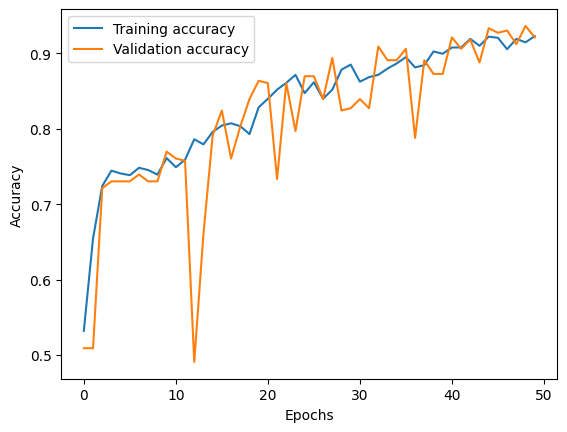

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
#plt.title('model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['Training accuracy', 'Validation accuracy'], loc='upper left')
plt.show()


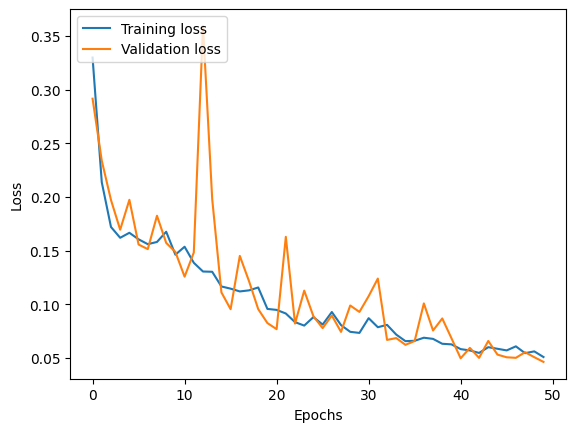

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
#plt.title('model loss')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['Training loss', 'Validation loss'], loc='upper left')
plt.show()

In [ ]:
test_accu = model.evaluate(test)
print('The testing accuracy is :',test_accu[1]*100, '%')
# Report the data from the graphs

13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 238ms/step - accuracy: 0.9431 - loss: 0.0383
The testing accuracy is : 92.99516677856445 %


In [ ]:
preds = model.predict(test,verbose=1)
predictions = preds.copy()
predictions[predictions <= 0.5] = 0
predictions[predictions > 0.5] = 1
# This turns probabilities into binary class labels (0 or 1) for evaluation or confusion matrix use.

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(32, 299, 299, 3))
  warnings.warn(msg)


12/13 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(None, 299, 299, 3))
  warnings.warn(msg)


13/13 ━━━━━━━━━━━━━━━━━━━━ 33s 1s/step


In [ ]:
# Predictions
preds

array([[0.8928605 , 0.09862841],
       [0.89447516, 0.09162887],
       [0.90186626, 0.06350355],
       [0.8969053 , 0.32645565],
       [0.9071296 , 0.09486692],
       [0.90348214, 0.07303368],
       [0.8868893 , 0.10777702],
       [0.8905446 , 0.07994216],
       [0.8872172 , 0.10952572],
       [0.8920164 , 0.09538706],
       [0.88970834, 0.10192189],
       [0.89079326, 0.10286625],
       [0.89061356, 0.10351255],
       [0.89102817, 0.10146568],
       [0.88299847, 0.08208152],
       [0.89162874, 0.10640534],
       [0.9030125 , 0.06461485],
       [0.90345263, 0.07098383],
       [0.90161234, 0.08478158],
       [0.8993839 , 0.07207134],
       [0.8989251 , 0.06354807],
       [0.88703865, 0.0797198 ],
       [0.8863197 , 0.0820301 ],
       [0.88711303, 0.08597316],
       [0.8892915 , 0.12130951],
       [0.88452655, 0.07983778],
       [0.8862987 , 0.08813106],
       [0.88186294, 0.09403762],
       [0.8848923 , 0.08805393],
       [0.862676  , 0.21868077],
       [0.

In [ ]:
x

array([[[[-0.40760395, -0.45795688, -0.48501962],
         [-0.40760395, -0.45795688, -0.48501962],
         [-0.40760395, -0.45795688, -0.48501962],
         ...,
         [-0.40760395, -0.45795688, -0.48501962],
         [-0.40760395, -0.45795688, -0.48501962],
         [-0.40760395, -0.45795688, -0.48501962]],

        [[-0.40760395, -0.45795688, -0.48501962],
         [-0.40760395, -0.45795688, -0.48501962],
         [-0.40760395, -0.45795688, -0.48501962],
         ...,
         [-0.40760395, -0.45795688, -0.48501962],
         [-0.40760395, -0.45795688, -0.48501962],
         [-0.40760395, -0.45795688, -0.48501962]],

        [[-0.40760395, -0.45795688, -0.48501962],
         [-0.40760395, -0.45795688, -0.48501962],
         [-0.40760395, -0.45795688, -0.48501962],
         ...,
         [-0.40760395, -0.45795688, -0.48501962],
         [-0.40760395, -0.45795688, -0.48501962],
         [-0.40760395, -0.45795688, -0.48501962]],

        ...,

        [[-0.40760395, -0.45795688, -0

In [ ]:
#Confusion Matrix and Classification Report
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

#Y_pred = model.predict_generator(validation_generator, nb_validation_samples //
#batch_size+1)
y_pred = np.argmax(preds, axis=1)

print('Confusion Matrix')
print(confusion_matrix(test.classes, y_pred))

Confusion Matrix
[[185  18]
 [ 11 200]]


In [ ]:
print('Classification Report')
target_names = ['Benign', 'Malignant']
print(classification_report(test.classes, y_pred, target_names=target_names))

Classification Report
              precision    recall  f1-score   support

      Benign       0.94      0.91      0.93       203
   Malignant       0.92      0.95      0.93       211

    accuracy                           0.93       414
   macro avg       0.93      0.93      0.93       414
weighted avg       0.93      0.93      0.93       414



<Axes: >

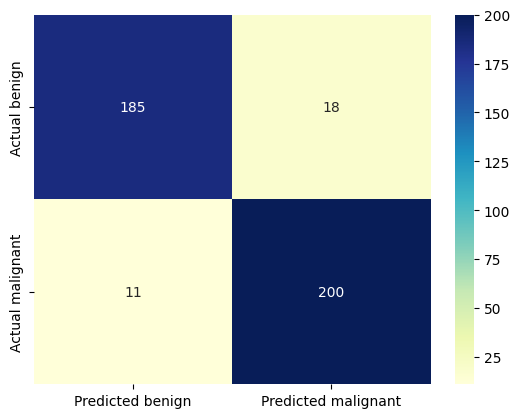

In [ ]:
from sklearn.metrics import classification_report,confusion_matrix
cm = pd.DataFrame(data=confusion_matrix( y_true= test.classes, y_pred= y_pred, labels=[0, 1]), index=["Actual benign", "Actual malignant"],columns=["Predicted benign", "Predicted malignant"])
import seaborn as sns
sns.heatmap(cm,annot=True,fmt="d",cmap="YlGnBu")

In [ ]:
# It calculates and returns three key classification metrics
from sklearn.metrics import precision_score, recall_score
from sklearn.metrics import f1_score

precision_score(test.classes, y_pred) , recall_score(test.classes, y_pred) ,  f1_score(test.classes, y_pred)

(0.9174311926605505, 0.9478672985781991, 0.9324009324009324)

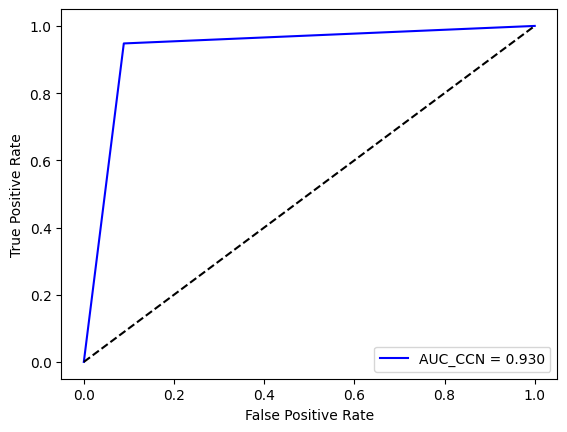

In [ ]:
import sklearn.metrics as metrics
fpr, tpr, threshold = metrics.roc_curve(test.classes, y_pred)
roc_auc = metrics.auc(fpr, tpr)
import matplotlib.pyplot as plt
#plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC_CCN = %0.3f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'k--')
# plt.xlim([0, 1])
# plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
#plt.title('ROC curve_CCN')

plt.show()

In [ ]:
test.classes

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

In [ ]:
y_pred

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

In [ ]:
preds

array([[0.8928605 , 0.09862841],
       [0.89447516, 0.09162887],
       [0.90186626, 0.06350355],
       [0.8969053 , 0.32645565],
       [0.9071296 , 0.09486692],
       [0.90348214, 0.07303368],
       [0.8868893 , 0.10777702],
       [0.8905446 , 0.07994216],
       [0.8872172 , 0.10952572],
       [0.8920164 , 0.09538706],
       [0.88970834, 0.10192189],
       [0.89079326, 0.10286625],
       [0.89061356, 0.10351255],
       [0.89102817, 0.10146568],
       [0.88299847, 0.08208152],
       [0.89162874, 0.10640534],
       [0.9030125 , 0.06461485],
       [0.90345263, 0.07098383],
       [0.90161234, 0.08478158],
       [0.8993839 , 0.07207134],
       [0.8989251 , 0.06354807],
       [0.88703865, 0.0797198 ],
       [0.8863197 , 0.0820301 ],
       [0.88711303, 0.08597316],
       [0.8892915 , 0.12130951],
       [0.88452655, 0.07983778],
       [0.8862987 , 0.08813106],
       [0.88186294, 0.09403762],
       [0.8848923 , 0.08805393],
       [0.862676  , 0.21868077],
       [0.

In [ ]:
k = np.array(preds)

for i in range(len(k)):
    print(k[i,1])

0.09862841
0.09162887
0.06350355
0.32645565
0.094866924
0.07303368
0.10777702
0.07994216
0.10952572
0.09538706
0.10192189
0.102866255
0.10351255
0.10146568
0.08208152
0.10640534
0.064614855
0.07098383
0.08478158
0.072071336
0.06354807
0.0797198
0.082030095
0.08597316
0.12130951
0.07983778
0.08813106
0.09403762
0.08805393
0.21868077
0.10655091
0.05846793
0.11089772
0.07581053
0.065961875
0.09943026
0.06468733
0.06932266
0.08604925
0.06163997
0.08316513
0.08309842
0.2095196
0.080970615
0.2184229
0.13751833
0.08882357
0.07671788
0.075289965
0.08032803
0.14544575
0.06806531
0.065948844
0.06806132
0.05862954
0.05858792
0.058908533
0.057679433
0.076157294
0.077162735
0.08334128
0.09060537
0.08885007
0.07185311
0.095763944
0.13252632
0.11383692
0.08942229
0.08784716
0.09517235
0.09391917
0.09203043
0.11327446
0.10868372
0.08391072
0.06506285
0.0699552
0.0792822
0.10579698
0.10417983
0.09384035
0.0890595
0.075324945
0.11686478
0.11303902
0.116349064
0.08111631
0.075046286
0.07613148
0.07587528

In [ ]:
y_pred_lcc = [0.028556198,
                0.036264837,
                0.045904934,
                0.07783383,
                0.08590597,
                0.04871445,
                0.031981736,
                0.024272181,
                0.066361524,
                0.06890115,
                0.047308177,
                0.045798127,
                0.12051045,
                0.25801516,
                0.22914161,
                0.2906252,
                0.044566978,
                0.06616995,
                0.019743768,
                0.0713164,
                0.13202864,
                0.075330146,
                0.08552809,
                0.13500589,
                0.049969897,
                0.0182101,
                0.059134938,
                0.010393291,
                0.008430552,
                0.016586622,
                0.020500347,
                0.038283248,
                0.04742722,
                0.09117431,
                0.017055823,
                0.057457983,
                0.018633105,
                0.027763901,
                0.04515383,
                0.006824695,
                0.016424175,
                0.011119718,
                0.027998742,
                0.03771691,
                0.05336398,
                0.02165394,
                0.010933277,
                0.066430815,
                0.026733316,
                0.06607017,
                0.031686313,
                0.05493254,
                0.0715966,
                0.06287401,
                0.012527313,
                0.015087274,
                0.013146846,
                0.008503055,
                0.012166098,
                0.009714344,
                0.015911227,
                0.008517494,
                0.005373175,
                0.008318807,
                0.011549884,
                0.03530536,
                0.06565144,
                0.10083423,
                0.06584942,
                0.0655092,
                0.11919653,
                0.05626450,
                0.2053877,
                0.12850806,
                0.08680162,
                0.037348848,
                0.046960175,
                0.056720328,
                0.054216076,
                0.06366877,
                0.026330581,
                0.018124806,
                0.052218094,
                0.05664259,
                0.06790027,
                0.01832857,
                0.02552386,
                0.0217961,
                0.350742,
                0.47872,
                0.5121031,
                0.58900034,
                0.22994295,
                0.12586416,
                0.1697897,
                0.0995228,
                0.10889927,
                0.115634985,
                0.06745842,
                0.1470058,
                0.058111172,
                0.10056989,
                0.054297615,
                0.08793732,
                0.052688915,
                0.057406098,
                0.057770308,
                0.019120745,
                0.02751854,
                0.036053006,
                0.12512136,
                0.41296855,
                0.50587726,
                0.55119646,
                0.5950358,
                0.01246436,
                0.22890855,
                0.22033605,
                0.17859858,
                0.032462057,
                0.032761175,
                0.042450447,
                0.023323506,
                0.2683991,
                0.07441281,
                0.021892315,
                0.13595025,
                0.07467944,
                0.06068779,
                0.13508871,
                0.09668758,
                0.030376295,
                0.10188549,
                0.21443836,
                0.07351891,
                0.08963578,
                0.13791823,
                0.059012786,
                0.2244597,
                0.270386,
                0.3403386,
                0.31439894,
                0.3915934,
                0.24801767,
                0.21670367,
                0.26069245,
                0.008594123,
                0.008028193,
                0.020965988,
                0.014475201,
                0.007075853,
                0.0036726205,
                0.0032438363,
                0.02640245,
                0.019428378,
                0.025149707,
                0.019764168,
                0.008985662,
                0.0021304507,
                0.0029556605,
                0.017776273,
                0.04877892,
                0.10095508,
                0.04463359,
                0.03382341,
                0.028040633,
                0.05628356,
                0.28779438,
                0.059707776,
                0.17265104,
                0.26250023,
                0.19848897,
                0.11291338,
                0.05975913,
                0.1939459,
                0.14168504,
                0.24167036,
                0.15721355,
                0.18500131,
                0.10183309,
                0.10287987,
                0.094555505,
                0.16914594,
                0.23086086,
                0.34613797,
                0.17864671,
                0.19718452,
                0.2413655,
                0.18779448,
                0.18768588,
                0.18919308,
                0.1788478,
                0.27412274,
                0.2848561,
                0.3075325,
                0.12285396,
                0.13683239,
                0.08249096,
                0.17738117,
                0.055088125,
                0.14556973,
                0.062502906,
                0.15083195,
                0.031311158,
                0.046950076,
                0.03027097,
                0.011592746,
                0.061848138,
                0.090527244,
                0.03722526,
                0.008798704,
                0.010917802,
                0.011883586,
                0.01935539,
                0.036769737,
                0.15501638,
                0.17832248,
                0.34044394,
                0.26456842,
                0.29946253,
                0.26480538,
                0.25132626,
                0.09513746,
                0.16024703,
                0.08914178,
                0.050896756,
                0.2125607,
                0.11749104,
                0.08027495,
                0.62514156,
                0.5545717,
                0.440941,
                0.4511305,
                0.73430276,
                0.76085377,
                0.5980266,
                0.68408793,
                0.59233797,
                0.5248784,
                0.36779097,
                0.5254001,
                0.6329511,
                0.6046284,
                0.190233,
                0.1423473,
                0.1740147,
                0.41584447,
                0.23796858,
                0.14435495,
                0.23140268,
                0.30651292,
                0.31832474,
                0.044497646,
                0.024211273,
                0.03315566,
                0.026728785,
                0.026455918,
                0.03848143,
                0.027173588,
                0.023735486,
                0.02471205,
                0.027339043,
                0.03549156,
                0.026461001,
                0.057620224,
                0.16329864,
                0.23747769,
                0.19847181,
                0.037806954,
                0.057451513,
                0.5515328,
                0.3406767,
                0.0661077,
                0.03530613,
                0.036982402,
                0.0369033,
                0.03965805,
                0.09584157,
                0.013942639,
                0.0076258294,
                0.056346867,
                0.026728071,
                0.117693014,
                0.19218808,
                0.32767087,
                0.082954295,
                0.049996417,
                0.09958111,
                0.025213623,
                0.013497193,
                0.033174384,
                0.04423301,
                0.22977224,
                0.09845024,
                0.01847586,
                0.008469506,
                0.0072284904,
                0.025593447,
                0.030585643,
                0.01671161,
                0.047838293,
                0.05680066,
                0.062516905,
                0.035970848,
                0.032756567,
                0.028282253,
                0.54385304,
                0.42755553,
                0.43149135,
                0.40761366,
                0.33623067,
                0.47728655,
                0.38627174,
                0.22522227,
                0.47755775,
                0.09871519,
                0.3226238,
                0.3182302,
                0.20443672,
                0.15825865,
                0.4844675,
                0.39210024,
                0.029991778,
                0.04568685,
                0.020621546,
                0.33559453,
                0.13380828,
                0.30871087,
                0.28966585,
                0.35643223,
                0.32338226,
                0.15795179,
                0.25067097,
                0.39055565,
                0.32143256,
                0.20387754,
                0.071512125,
                0.0427664,
                0.0404171,
                0.07937756,
                0.07573542,
                0.046077244,
                0.049795706,
                0.030623345,
                0.06902236,
                0.042496342,
                0.02819472,
                0.051176347,
                0.43694448,
                0.34325877,
                0.34334782,
                0.25799787,
                0.24354225,
                0.26475364,
                0.07575965,
                0.13486977,
                0.106374405,
                0.08405006,
                0.06834212,
                0.08470453,
                0.34886685,
                0.37116888,
                0.35344395,
                0.269455,
                0.1081744,
                0.09364605,
                0.19889258,
                0.12963426,
                0.1494618,
                0.15325435,
                0.36071745,
                0.35913974,
                0.42781433,
                0.24658328,
                0.17794,
                0.202611,
                0.2984478,
                0.2861658,
                0.29994926,
                0.5789486,
                0.45021448,
                0.30108872,
                0.31028873,
                0.29773393,
                0.2996102,
                0.23243184,
                0.3163006,
                0.23790653,
                0.27204242,
                0.38215297,
                0.006188200,
                0.02529095,
                0.0376847,
                0.01364516,
                0.01879364,
                0.024273764,
                0.010066827,
                0.017765246,
                0.017922588,
                0.02052927,
                0.011036452,
                0.04000968,
                0.05556476,
                0.03485008,
                0.05361983,
                0.07320957,
                0.119496696,
                0.14681411,
                0.04762297,
                0.11563565,
                0.104212485,
                0.08644132,
                0.0740085,
                0.08556893,
                0.04966269,
                0.13126579,
                0.25090104,
                0.18188787,
                0.234541,
                0.1123868,
                0.14491469,
                0.19146568,
                0.10846985,
                0.036941614,
                0.026473233,
                0.027862292,
                0.044251777,
                0.043922815,
                0.035624627,
                0.06773232,
                0.06974635,
                0.04370218,
                0.8260963,
                0.84076893,
                0.8406657,
                0.8668696,
                0.8655141,
                0.84628516,
                0.8222449,
                0.81873935,
                0.82718164,
                0.8521381,
                0.8479192,
                0.8466091,
                0.85140854,
                0.85980666,
                0.62744355,
                0.5073786,
                0.38193533,
                0.5076172,
                0.57241744,
                0.7196206,
                0.7437221,
                0.49401206,
                0.45631728,
                0.315333,
                0.3380986,
                0.43606254,
                0.42091498,
                0.8532079,
                0.84935534,
                0.8551373,
                0.84434336,
                0.83939016,
                0.83901393,
                0.8249531,
                0.84037817,
                0.8296958,
                0.84336823,
                0.85741717,
                0.8398933,
                0.8376784,
                0.8389766,
                0.83304715,
                0.87578195,
                0.8696503,
                0.8648139,
                0.87807274,
                0.88601685,
                0.8796862,
                0.82877856,
                0.8337109,
                0.8107376,
                0.83002436,
                0.8444455,
                0.85840535,
                0.8450912,
                0.8473374,
                0.83672655,
                0.8454819,
                0.84169155,
                0.84742165,
                0.86260086,
                0.8350372,
                0.8329889,
                0.8457303,
                0.83916473,
                0.82216495,
                0.8759199,
                0.8624426,
                0.8985313,
                0.8901899,
                0.8859924,
                0.8866888,
                0.8855328,
                0.8904607,
                0.89234173,
                0.87469405,
                0.8957011,
                0.86600775,
                0.9045627,
                0.84964645,
                0.75749564,
                0.87510407,
                0.83398914,
                0.78506905,
                0.8194802,
                0.84288234,
                0.839299,
                0.8319575,
                0.8274795,
                0.8192883,
                0.82197964,
                0.8043891,
                0.81338966,
                0.8177817,
                0.8020291,
                0.81016034,
                0.8994703,
                0.8692192,
                0.8788436,
                0.88505834,
                0.8837665,
                0.88484913,
                0.88720113,
                0.876811,
                0.8889753,
                0.88803095,
                0.88598406,
                0.8933338,
                0.8586466,
                0.87193656,
                0.8699374,
                0.85298926,
                0.8173121,
                0.802731,
                0.8118342,
                0.8082844,
                0.8261343,
                0.8261437,
                0.8250854,
                0.9006226,
                0.8978728,
                0.8995869,
                0.90194345,
                0.8914033,
                0.8938255,
                0.89439905,
                0.8785347,
                0.88270974,
                0.8883204,
                0.88606495,
                0.9020567,
                0.9050109,
                0.90823066,
                0.8904642,
                0.7915087,
                0.7454275,
                0.7189565,
                0.77963215,
                0.75802016,
                0.71015465,
                0.8235913,
                0.7412301,
                0.7212943,
                0.73090297,
                0.7461991,
                0.6887732,
                0.53113496,
                0.39321485,
                0.5080317,
                0.7092719,
                0.8423914,
                0.8538411,
                0.21018004,
                0.1679097,
                0.274263,
                0.81531936,
                0.7896826,
                0.7571473,
                0.8571976,
                0.87258846,
                0.88053834,
                0.46425107,
                0.45613563,
                0.50632536,
                0.5701773,
                0.47661564,
                0.49599427,
                0.44998455,
                0.67346925,
                0.48396957,
                0.6551712,
                0.23725407,
                0.3066424,
                0.010232544,
                0.21473043,
                0.14414874,
                0.14177507,
                0.2109072,
                0.8851084,
                0.88748103,
                0.8949157,
                0.89103997,
                0.88408995,
                0.8880719,
                0.90931,
                0.90432924,
                0.89806974,
                0.9134788,
                0.90664613,
                0.8985491,
                0.883111,
                0.88609,
                0.8102,
                0.88094354,
                0.8983823,
                0.8930812,
                0.9120083,
                0.88367844,
                0.89354336,
                0.8577436,
                0.8058272,
                0.8879791,
                0.89516526,
                0.8943142,
                0.8583007,
                0.8445064,
                0.85303664,
                0.84541404,
                0.8994673,
                0.8983614,
                0.8985871,
                0.88430357,
                0.9041934,
                0.8978502,
                0.90430444,
                0.90094274,
                0.88738424,
                0.8856829,
                0.8933187,
                0.88606256,
                0.89238316,
                0.89899623,
                0.89873964,
                0.9077142,
                0.90807754,
                0.90659416,
                0.90710425,
                0.9051356,
                0.91045886,
                0.9125247,
                0.9108552,
                0.9072052,
                0.9053249,
                0.9087807,
                0.90966403,
                0.915426,
                0.9127564,
                0.9139511,
                0.91541266,
                0.91609615,
                0.9153669,
                0.91522247,
                0.9161941,
                0.92311484,
                0.9246786,
                0.922886,
                0.9135237,
                0.9156833,
                0.9192214,
                0.9175464,
                0.9260957,
                0.9290081,
                0.9264529,
                0.926901,
                0.921366,
                0.9226128,
                0.9203395,
                0.92167515,
                0.89939773,
                0.9006078,
                0.90109617,
                0.89358205,
                0.8975856,
                0.8990682,
                0.9032995,
                0.8998787,
                0.9005697,
                0.89987856,
                0.9036741,
                0.90274775,
                0.9046404,
                0.9022366,
                0.90435076,
                0.90685683,
                0.90384305,
                0.5149059,
                0.59509754,
                0.64364284,
                0.69957095,
                0.7535485,
                0.585719,
                0.6021433,
                0.65594745,
                0.5548708,
                0.64338434,
                0.58502626,
                0.6878446,
                0.61586046,
                0.67244625,
                0.70211554,
                0.65130234,
                0.6926859,
                0.8971512,
                0.8854653,
                0.8730635,
                0.88265675,
                0.90886533,
                0.8540921,
                0.83123195,
                0.8644246,
                0.8672613,
                0.8468004,
                0.89114815,
                0.867272,
                0.8832198,
                0.8722542,
                0.84377754,
                0.8546608,
                0.89926064,
                0.8928772,
                0.90196294,
                0.9056331,
                0.89772826,
                0.89589965,
                0.8976308,
                0.90203625,
                0.90285563,
                0.8906046,
                0.8932843,
                0.88814205,
                0.8887443,
                0.88635623,
                0.88738143,
                0.8947854,
                0.8908824,
                0.8903027,
                0.90115327,
                0.897345,
                0.9078498,
                0.914618,
                0.9158767,
                0.91586435,
                0.90691894,
                0.90760744,
                0.92318076,
                0.9252385,
                0.91071814,
                0.91515774,
                0.9230022,
                0.9258823,
                0.91930044,
                0.91102463,
                0.8953971,
                0.90439475,
                0.90366375,
                0.88395697,
                0.8891664,
                0.8820886,
                0.90740454,
                0.9042107,
                0.8973975,
                0.9023042,
                0.903557,
                0.90627134,
                0.8805604,
                0.847623,
                0.8687451,
                0.8056517,
                0.81472206,
                0.82560945,
                0.8677915,
                0.83457845,
                0.81183916,
                0.78248334,
                0.859505,
                0.8390613,
                0.8250869,
                0.8061907,
                0.8342634,
                0.6641237,
                0.75505626,
                0.6808149,
                0.8659731,
                0.84137326,
                0.8223766,
                0.81035846,
                0.86878103,
                0.8717991,
                0.69219583,
                0.7677811,
                0.8092483,
                0.8722951,
                0.88539326,
                0.8907489,
                0.8677911,
                0.833777,
                0.8755618,
                0.9018667,
                0.9012082,
                0.8982369,
                0.83287394,
                0.84501714,
                0.8527001,
                0.8625851,
                0.84790015,
                0.83607256,
                0.8192705,
                0.84326255,
                0.84087855,
                0.84255046,
                0.85124475,
                0.831781,
                0.84017,
                0.8379826,
                0.85222214,
                0.7985256,
                0.7959674,
                0.81171936,
                0.8942692,
                0.8970335,
                0.9004551,
                0.91170776,
                0.91100025,
                0.91245794,
                0.90796906,
                0.90901065,
                0.90703684,
                0.89536893,
                0.90392447,
                0.9038097,
                0.894611,
                0.889759,
                0.8976424,
                0.880322,
                0.8738618,
                0.8814538,
                0.90936697,
                0.91081434,
                0.91289794,
                0.89849246,
                0.9006467,
                0.906143,
                0.8913299,
                0.8894615,
                0.8880569]

In [ ]:
test= [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1]

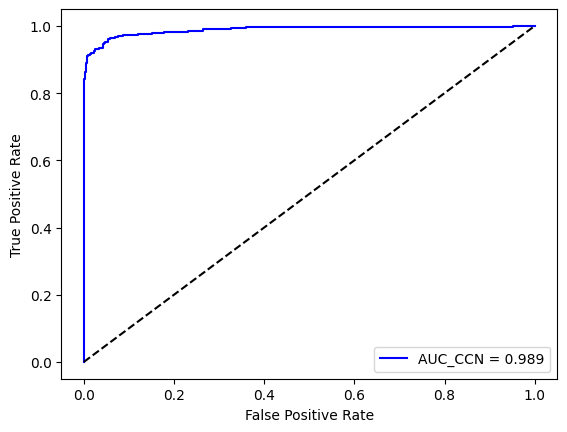

In [ ]:
import sklearn.metrics as metrics
fpr, tpr, threshold = metrics.roc_curve(test, y_pred_lcc)
roc_auc = metrics.auc(fpr, tpr)
import matplotlib.pyplot as plt
#plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC_CCN = %0.3f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'k--')
# plt.xlim([0, 1])
# plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
#plt.title('ROC curve_CCN')

plt.show()

# All the codes above was the old research done before by Bushara A R · 1y ago LCD-CapsNet_LungCancer.

This code is a Capsule Network model using TensorFlow/Keras to classify medical images like CT scans or X-rays from the LIDC-IDRI dataset into benign or malignant.

**Key Componets**
* Data set is orginize into train,valid and test folders
* Each folders have bening and malignant tumors

**Old project Architecture**
* A CNN feature extractor built with Conv2D, BatchNormalization, and Pooling.
* Followed by Capsule Layers for classification — a more advanced method than traditional dense layers, good for preserving spatial information.
* Final output: 2 capsules representing the two classes.

**Training Setup**
* Uses ImageDataGenerator for image loading and augmentation.
* Tracks accuracy and loss during training.
* Saves the best model using ModelCheckpoint.

**Evaluation**
* Accuracy, loss, confusion matrix, classification report, precision/recall/F1,  and ROC curve are all calculated.
* Outputs and predictions are carefully post-processed and visualized.


**Conclusion**
* The prevoius work done by Bushara, is a  binary classification model using a Capsule Network to detect lung cancer benign vs malignant from medical images, with full training, evaluation, and visualization.



In [ ]:
# All imports
from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt
import torchvision
from torchvision import transforms
import os


In [ ]:
# libraries: pls do it once
!pip install pydicom matplotlib pillow


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 22.4 MB/s eta 0:00:00


In [ ]:
!pip install segmentation-models-pytorch --quiet


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 116.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 94.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 52.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 42.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 19.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 91.4 MB/s eta 0:00:00


## **Lung Segmentation with Unet**

This cells loads and process the Lung Cancer detection_LIDC-IDRI Subset files

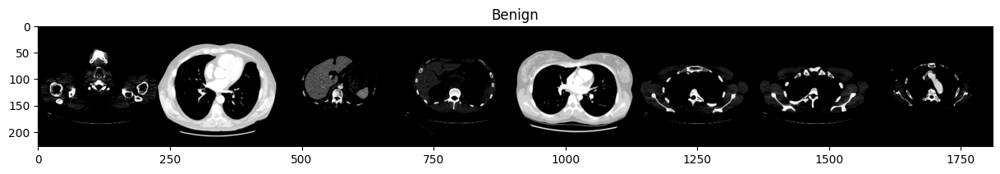

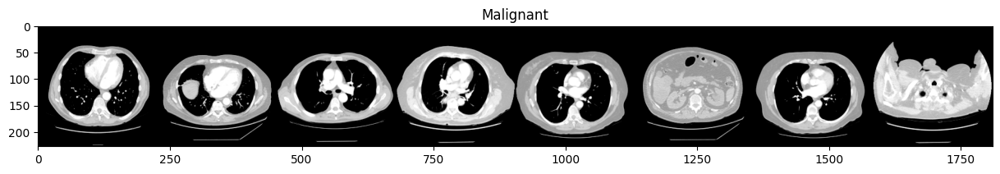

In [ ]:
# import the Lung Cancer detection_LIDC-IDRI Subset
# Done by james
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# Define image transforms
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])


train_path = os.path.join(dataset_path, 'train')
valid_path = os.path.join(dataset_path, 'valid')
test_path  = os.path.join(dataset_path, 'test')

train_data = datasets.ImageFolder(root=train_path, transform=transform)
valid_data = datasets.ImageFolder(root=valid_path, transform=transform)
test_data  = datasets.ImageFolder(root=test_path, transform=transform)

train_loader = DataLoader(train_data, batch_size=32, shuffle=True)
valid_loader = DataLoader(valid_data, batch_size=32, shuffle=False)
test_loader  = DataLoader(test_data, batch_size=32, shuffle=False)


def imshow(img):
    img = img / 2 + 0.5
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)), cmap='gray')
    plt.axis('off')
    plt.show()

dataiter = iter(train_loader)
images, labels = next(dataiter)

benign_imgs = images[labels == 0]
malignant_imgs = images[labels == 1]

def show_images_by_class(images, title, n=8):
    images = images[:n]
    grid = torchvision.utils.make_grid(images, nrow=n)
    npimg = grid.numpy()
    plt.figure(figsize=(15, 2))
    plt.imshow(np.transpose(npimg, (1, 2, 0)), cmap="gray")
    plt.title(title)
    plt.show()

show_images_by_class(benign_imgs, "Benign")
show_images_by_class(malignant_imgs, "Malignant")

# All img are from the train folder


Showing Gray-Level Enhanced Images for: BENIGN


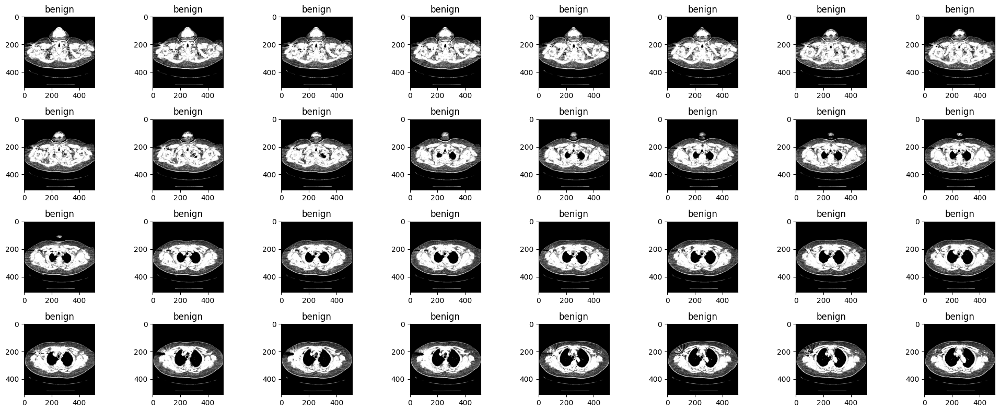


Showing Gray-Level Enhanced Images for: MALIGNANT


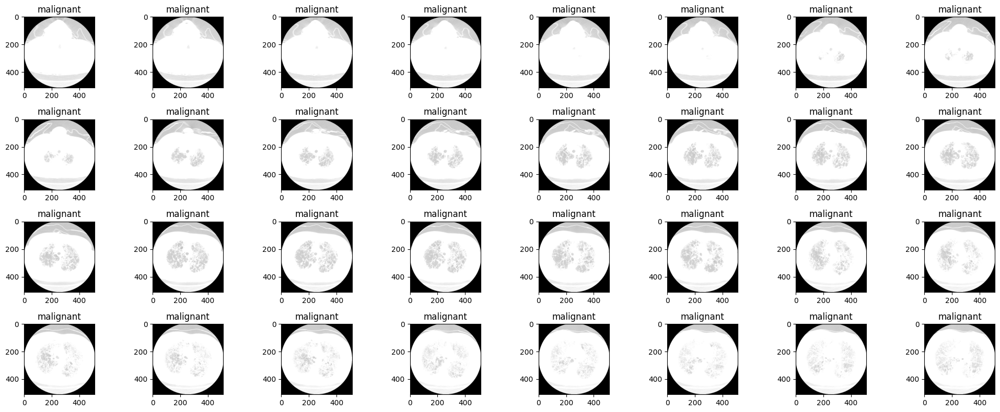

In [ ]:
# Function: Apply Gray-Level Transform
# James
def gray_level_transform(img: Image.Image, window_center=40, window_width=80):
    img_np = np.array(img).astype(np.float32)

    min_val = window_center - (window_width / 2)
    max_val = window_center + (window_width / 2)

    img_np = np.clip(img_np, min_val, max_val)
    img_np = (img_np - min_val) / (max_val - min_val) * 255.0
    img_np = img_np.astype(np.uint8)

    return Image.fromarray(img_np)

train_base = os.path.join(dataset_path, 'train')

# Loop through both benign and malignant
for label in ['benign', 'malignant']:
    print(f"\nShowing Gray-Level Enhanced Images for: {label.upper()}")

    folder_path = os.path.join(train_base, label)
    image_files = sorted(os.listdir(folder_path))

    # grayscale
    plt.figure(figsize=(20, 8))
    for idx, filename in enumerate(image_files):
        img_path = os.path.join(folder_path, filename)
        img = Image.open(img_path).convert('L')

        enhanced = gray_level_transform(img)

        plt.subplot(4, 8, idx + 1)
        plt.imshow(enhanced, cmap='gray')
        plt.title(f"{label}")


        if idx >= 31:
            break

    plt.tight_layout()
    plt.show()


Showing Histogram Equalized Images for: BENIGN


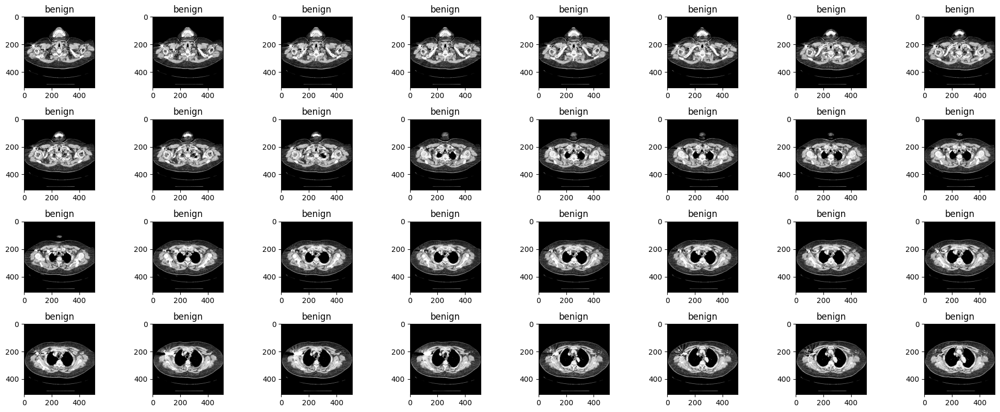


Showing Histogram Equalized Images for: MALIGNANT


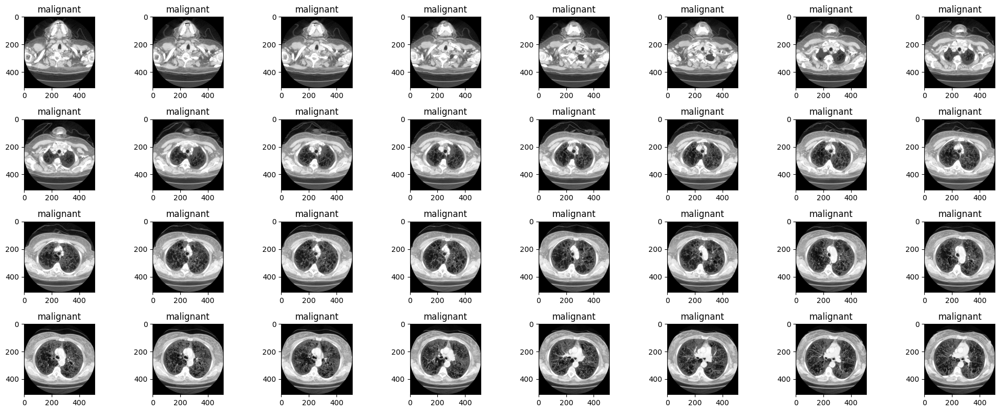

In [ ]:
# this code apply Histogram Equalization
def histogram_equalization(img: Image.Image):
    img_np = np.array(img.convert('L'))
    equalized = cv2.equalizeHist(img_np)
    return Image.fromarray(equalized)

train_base = os.path.join(dataset_path, 'train')

for label in ['benign', 'malignant']:
    print(f"\nShowing Histogram Equalized Images for: {label.upper()}")

    folder_path = os.path.join(train_base, label)
    image_files = sorted(os.listdir(folder_path))

    plt.figure(figsize=(20, 8))
    for idx, filename in enumerate(image_files):
        img_path = os.path.join(folder_path, filename)
        img = Image.open(img_path).convert('L')

        equalized_img = histogram_equalization(img)

        plt.subplot(4, 8, idx + 1)
        plt.imshow(equalized_img, cmap='gray')
        plt.title(f"{label}")


        if idx >= 31:
            break

    plt.tight_layout()
    plt.show()

In [ ]:
# Install and Load Pretrained UNet
# James
import segmentation_models_pytorch as smp
import torch.nn as nn
import torch
import torchvision.transforms as T
from PIL import Image

# Load pre-trained UNet
model = smp.Unet(encoder_name="resnet34", encoder_weights="imagenet", in_channels=1, classes=1)
model.eval()

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/87.3M [00:00<?, ?B/s]

Unet(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track

In [ ]:
import os
from PIL import Image
import torchvision.transforms as T
import torch
import numpy as np
# james
# repeated export because of too many mis takes

train_path = '/content/drive/MyDrive/Kean University🎒/[0] Classes/Spring 2025 (1 13 2025 - 5 7 2025) 8 Semester /CPS 4801 Sec 02/LIDC_IDRI_PNG_CONV/train/'
mask_base = '/content/drive/MyDrive/Kean University🎒/[0] Classes/Spring 2025 (1 13 2025 - 5 7 2025) 8 Semester /CPS 4801 Sec 02/LIDC_IDRI_PNG_CONV/masks/'

def preprocess_for_unet(image_path, size=(224, 224)):
    img = Image.open(image_path).convert('L')
    transform = T.Compose([
        T.Resize(size),
        T.ToTensor(),
        T.Normalize([0.5], [0.5]),
    ])
    return transform(img).unsqueeze(0)

# Predict mask
def predict_mask(img_tensor):
    with torch.no_grad():
        pred = model(img_tensor)
        pred_mask = torch.sigmoid(pred).squeeze().numpy()
        binary_mask = (pred_mask > 0.5).astype(np.uint8) * 255
        return binary_mask

for label in ['benign', 'malignant']:
    folder_path = os.path.join(train_path, label)
    mask_folder = os.path.join(mask_base, label)

    os.makedirs(mask_folder, exist_ok=True)

    print(f"\n Generating masks for: {label.upper()}")

    image_files = [f for f in os.listdir(folder_path) if f.endswith('.png')]

    for idx, image_file in enumerate(image_files):
        image_path = os.path.join(folder_path, image_file)
        try:
            img_tensor = preprocess_for_unet(image_path)
            predicted_mask = predict_mask(img_tensor)

            # Save predicted mask
            mask_img = Image.fromarray(predicted_mask)
            mask_img = mask_img.resize((224, 224))
            base_name = image_file.replace('.dcm.png', '').replace('.png', '')
            save_path = os.path.join(mask_folder, f"{base_name}_mask.png")
            mask_img.save(save_path)

            if idx % 25 == 0:
                print(f" Saved: {save_path}")
        except Exception as e:
            print(f"Failed to process {image_file}: {e}")
            if os.path.exists(save_path):
             print(f"Already exists, skipping: {save_path}")
        continue







 Generating masks for: BENIGN
 Saved: /content/drive/MyDrive/Kean University🎒/[0] Classes/Spring 2025 (1 13 2025 - 5 7 2025) 8 Semester /CPS 4801 Sec 02/LIDC_IDRI_PNG_CONV/masks/benign/1-003_mask.png
 Saved: /content/drive/MyDrive/Kean University🎒/[0] Classes/Spring 2025 (1 13 2025 - 5 7 2025) 8 Semester /CPS 4801 Sec 02/LIDC_IDRI_PNG_CONV/masks/benign/1-124_mask.png
 Saved: /content/drive/MyDrive/Kean University🎒/[0] Classes/Spring 2025 (1 13 2025 - 5 7 2025) 8 Semester /CPS 4801 Sec 02/LIDC_IDRI_PNG_CONV/masks/benign/1-046_mask.png
 Saved: /content/drive/MyDrive/Kean University🎒/[0] Classes/Spring 2025 (1 13 2025 - 5 7 2025) 8 Semester /CPS 4801 Sec 02/LIDC_IDRI_PNG_CONV/masks/benign/1-032_mask.png
 Saved: /content/drive/MyDrive/Kean University🎒/[0] Classes/Spring 2025 (1 13 2025 - 5 7 2025) 8 Semester /CPS 4801 Sec 02/LIDC_IDRI_PNG_CONV/masks/benign/1-193_mask.png
 Saved: /content/drive/MyDrive/Kean University🎒/[0] Classes/Spring 2025 (1 13 2025 - 5 7 2025) 8 Semester /CPS 4801 Sec

In [ ]:
# dont run this unless you want to delete the mask img
import glob

for label in ['benign', 'malignant']:
    mask_folder = os.path.join(mask_base, label)
    bad_masks = glob.glob(os.path.join(mask_folder, '*_mask_mask.png'))
    print(f"\n Cleaning {label.upper()}:")

    for path in bad_masks:
        print("  Deleting:", os.path.basename(path))
        os.remove(path)



🧹 Cleaning BENIGN:

🧹 Cleaning MALIGNANT:


This code generate a manual mask using custom coordinates, to

Train segmentation models

Evaluate model accuracy

Manually review tumor locations

✅ Processing: 1-001.dcm.png
 Saved mask: /content/drive/MyDrive/Kean University🎒/[0] Classes/Spring 2025 (1 13 2025 - 5 7 2025) 8 Semester /CPS 4801 Sec 02/LIDC_IDRI_PNG_CONV/masks/malignant/1-001_mask.png


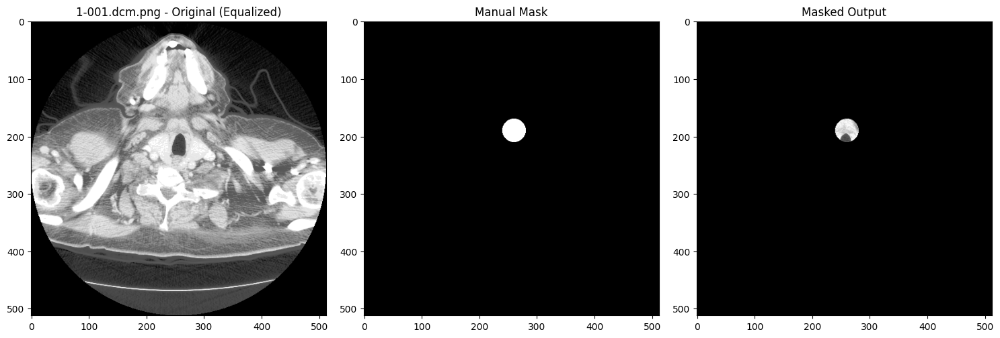

✅ Processing: 1-002.dcm.png
 Saved mask: /content/drive/MyDrive/Kean University🎒/[0] Classes/Spring 2025 (1 13 2025 - 5 7 2025) 8 Semester /CPS 4801 Sec 02/LIDC_IDRI_PNG_CONV/masks/malignant/1-002_mask.png


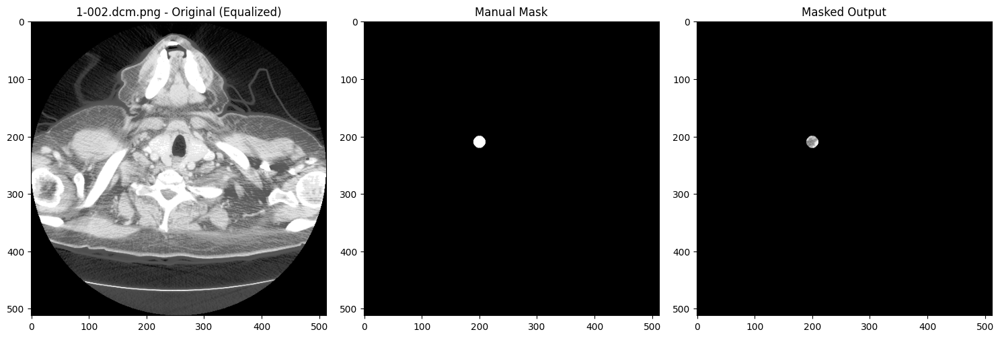

✅ Processing: 1-003.dcm.png
 Saved mask: /content/drive/MyDrive/Kean University🎒/[0] Classes/Spring 2025 (1 13 2025 - 5 7 2025) 8 Semester /CPS 4801 Sec 02/LIDC_IDRI_PNG_CONV/masks/malignant/1-003_mask.png


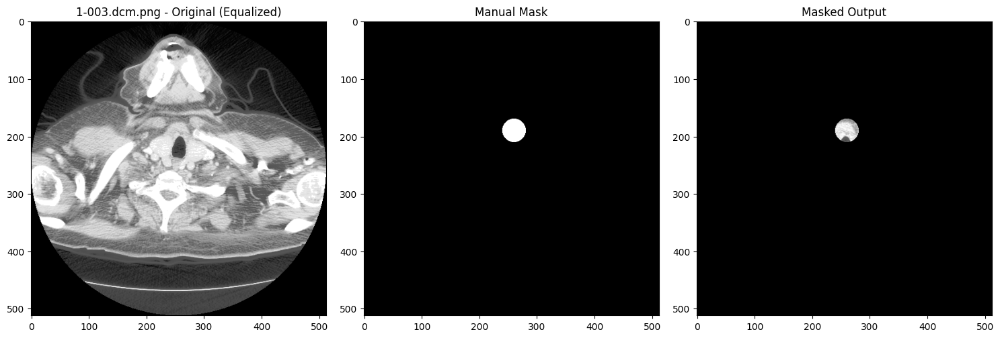

✅ Processing: 1-004.dcm.png
 Saved mask: /content/drive/MyDrive/Kean University🎒/[0] Classes/Spring 2025 (1 13 2025 - 5 7 2025) 8 Semester /CPS 4801 Sec 02/LIDC_IDRI_PNG_CONV/masks/malignant/1-004_mask.png


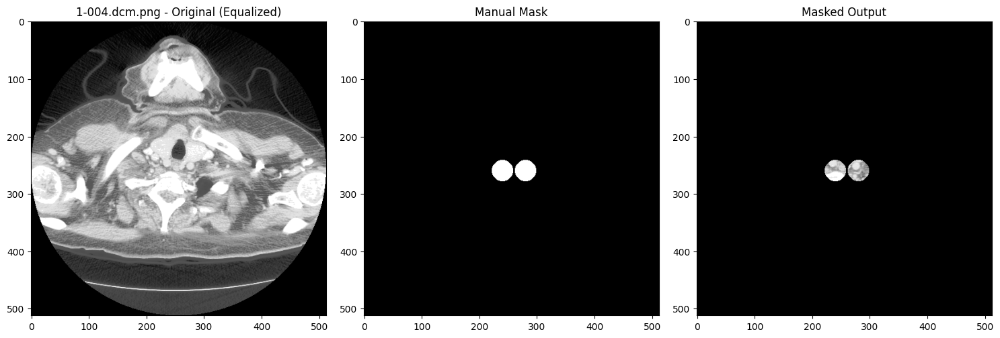

✅ Processing: 1-005.dcm.png
 Saved mask: /content/drive/MyDrive/Kean University🎒/[0] Classes/Spring 2025 (1 13 2025 - 5 7 2025) 8 Semester /CPS 4801 Sec 02/LIDC_IDRI_PNG_CONV/masks/malignant/1-005_mask.png


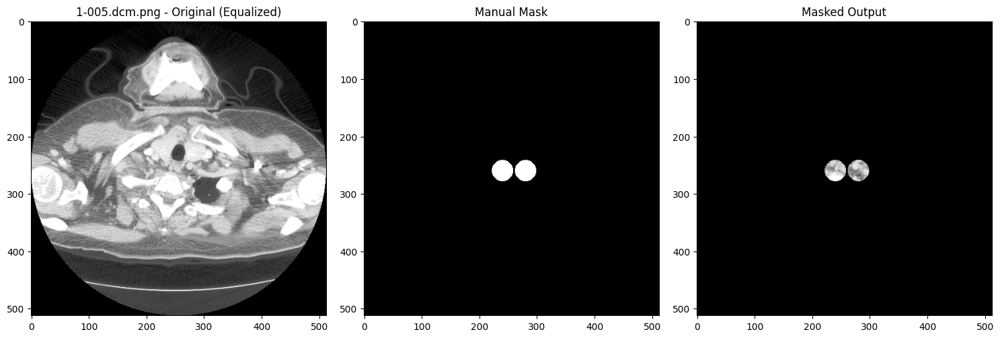

✅ Processing: 1-006.dcm.png
 Saved mask: /content/drive/MyDrive/Kean University🎒/[0] Classes/Spring 2025 (1 13 2025 - 5 7 2025) 8 Semester /CPS 4801 Sec 02/LIDC_IDRI_PNG_CONV/masks/malignant/1-006_mask.png


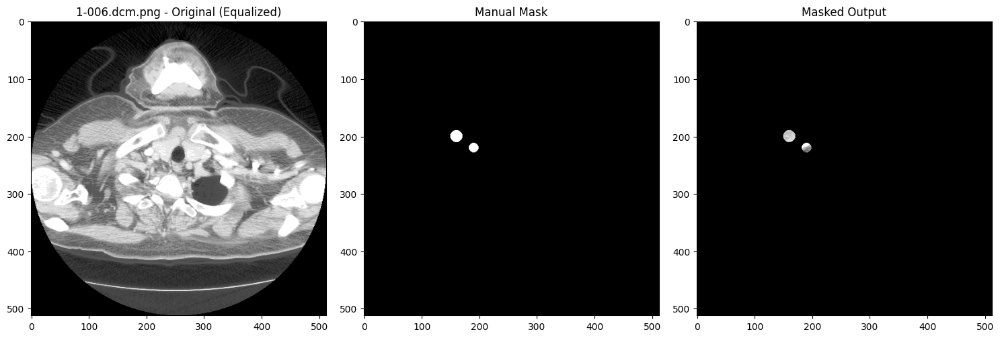

✅ Processing: 1-010.dcm.png
 Saved mask: /content/drive/MyDrive/Kean University🎒/[0] Classes/Spring 2025 (1 13 2025 - 5 7 2025) 8 Semester /CPS 4801 Sec 02/LIDC_IDRI_PNG_CONV/masks/malignant/1-010_mask.png


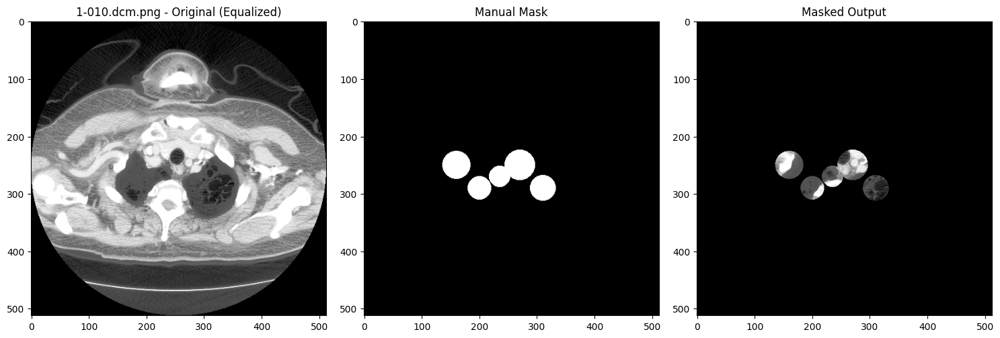

✅ Processing: 1-011.dcm.png
 Saved mask: /content/drive/MyDrive/Kean University🎒/[0] Classes/Spring 2025 (1 13 2025 - 5 7 2025) 8 Semester /CPS 4801 Sec 02/LIDC_IDRI_PNG_CONV/masks/malignant/1-011_mask.png


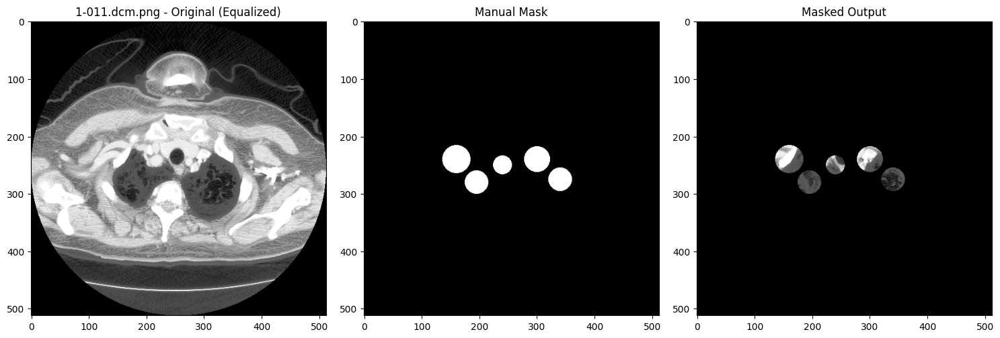

✅ Processing: 1-012.dcm.png
 Saved mask: /content/drive/MyDrive/Kean University🎒/[0] Classes/Spring 2025 (1 13 2025 - 5 7 2025) 8 Semester /CPS 4801 Sec 02/LIDC_IDRI_PNG_CONV/masks/malignant/1-012_mask.png


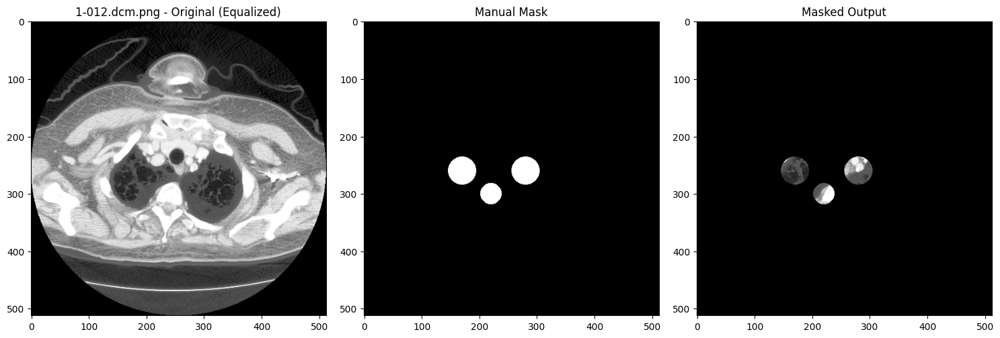

✅ Processing: 1-016.dcm.png
 Saved mask: /content/drive/MyDrive/Kean University🎒/[0] Classes/Spring 2025 (1 13 2025 - 5 7 2025) 8 Semester /CPS 4801 Sec 02/LIDC_IDRI_PNG_CONV/masks/malignant/1-016_mask.png


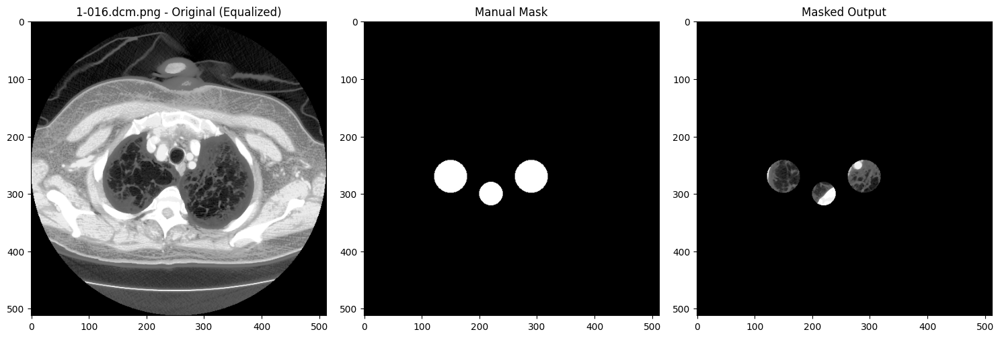

✅ Processing: 1-017.dcm.png
 Saved mask: /content/drive/MyDrive/Kean University🎒/[0] Classes/Spring 2025 (1 13 2025 - 5 7 2025) 8 Semester /CPS 4801 Sec 02/LIDC_IDRI_PNG_CONV/masks/malignant/1-017_mask.png


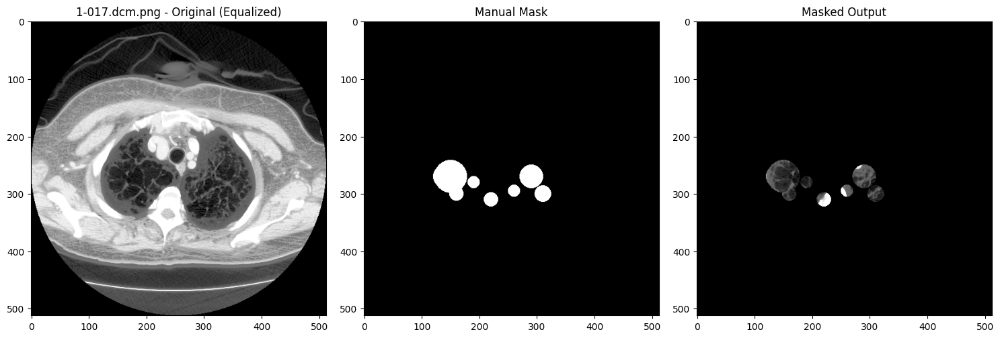

✅ Processing: 1-018.dcm.png
 Saved mask: /content/drive/MyDrive/Kean University🎒/[0] Classes/Spring 2025 (1 13 2025 - 5 7 2025) 8 Semester /CPS 4801 Sec 02/LIDC_IDRI_PNG_CONV/masks/malignant/1-018_mask.png


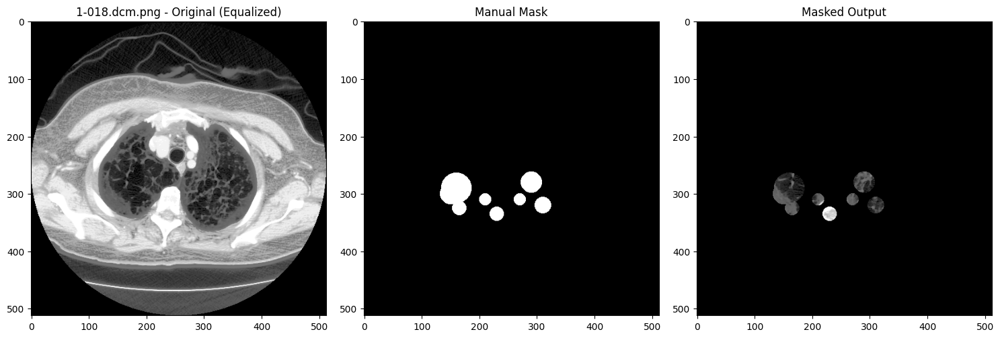

✅ Processing: 1-019.dcm.png
 Saved mask: /content/drive/MyDrive/Kean University🎒/[0] Classes/Spring 2025 (1 13 2025 - 5 7 2025) 8 Semester /CPS 4801 Sec 02/LIDC_IDRI_PNG_CONV/masks/malignant/1-019_mask.png


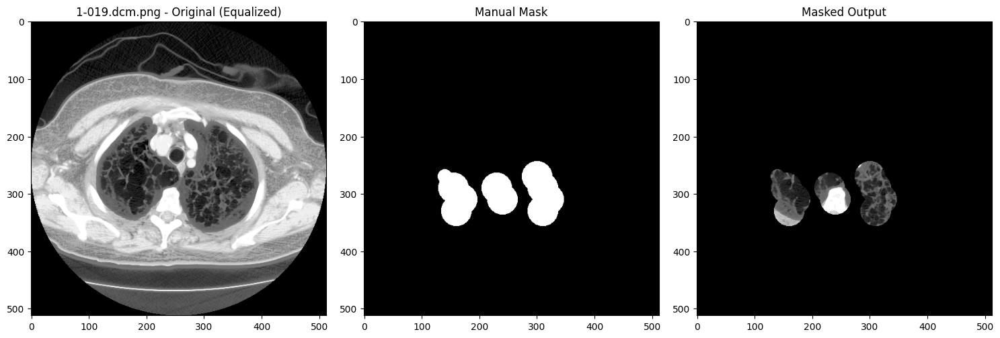

✅ Processing: 1-020.dcm.png
 Saved mask: /content/drive/MyDrive/Kean University🎒/[0] Classes/Spring 2025 (1 13 2025 - 5 7 2025) 8 Semester /CPS 4801 Sec 02/LIDC_IDRI_PNG_CONV/masks/malignant/1-020_mask.png


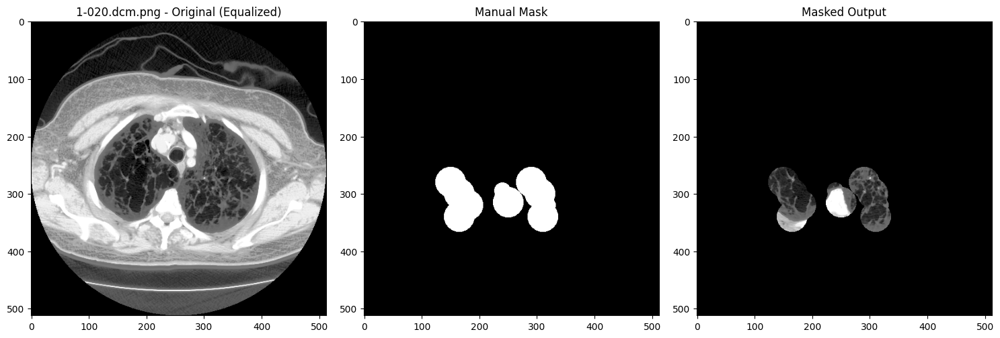

✅ Processing: 1-021.dcm.png
 Saved mask: /content/drive/MyDrive/Kean University🎒/[0] Classes/Spring 2025 (1 13 2025 - 5 7 2025) 8 Semester /CPS 4801 Sec 02/LIDC_IDRI_PNG_CONV/masks/malignant/1-021_mask.png


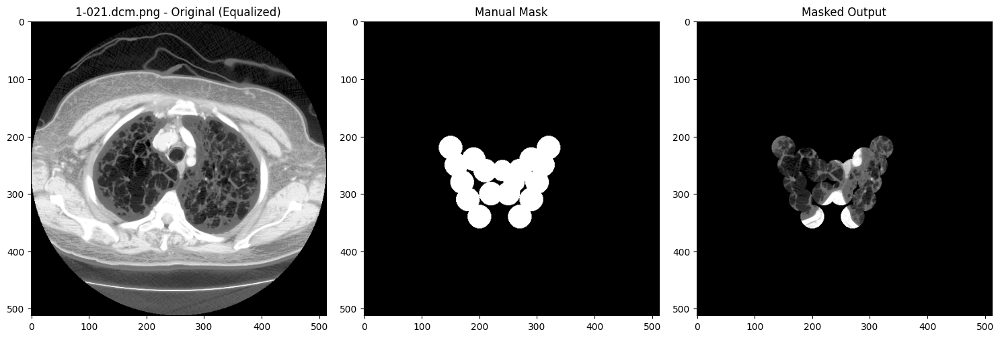

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image, ImageDraw
import cv2
import os

train_path = '/content/drive/MyDrive/Kean University🎒/[0] Classes/Spring 2025 (1 13 2025 - 5 7 2025) 8 Semester /CPS 4801 Sec 02/LIDC_IDRI_PNG_CONV/train/'
image_folder = os.path.join(train_path, 'malignant')
mask_output_folder = '/content/drive/MyDrive/Kean University🎒/[0] Classes/Spring 2025 (1 13 2025 - 5 7 2025) 8 Semester /CPS 4801 Sec 02/LIDC_IDRI_PNG_CONV/masks/malignant'
os.makedirs(mask_output_folder, exist_ok=True)
# done by james
# manual masking only 15
tumor_annotations = {
    "1-001.dcm.png": [(260, 190, 20)],
    "1-002.dcm.png": [ (200, 210, 10)],
    "1-003.dcm.png": [(260, 190, 20)],
    "1-004.dcm.png": [(240, 260, 18),(280, 260, 18)],
    "1-005.dcm.png": [(240, 260, 18),(280, 260, 18)],
    "1-006.dcm.png": [(160, 200, 10), (190, 220, 8)],
    "1-010.dcm.png": [ (160, 250, 24),
    (200, 290, 20),
    (270, 250, 26),
    (310, 290, 22),
    (235, 270, 18) ],
    "1-011.dcm.png": [(160, 240, 24),
    (195, 280, 20),
    (240, 250, 16),
    (300, 240, 22),
    (340, 275, 20)   ],
    "1-012.dcm.png": [(170, 260, 24),
    (220, 300, 18),
    (280, 260, 24)   ],
    "1-016.dcm.png": [   (150, 270, 28),
    (220, 300, 20),
    (290, 270, 28)   ],
    "1-017.dcm.png": [    (150, 270, 28),     (140, 270, 20),
    (160, 300, 12),
    (190, 280, 10),
    (220, 310, 12),
    (260, 295, 10),
    (290, 270, 20),
    (310, 300, 14)   ],
    "1-018.dcm.png": [    (160, 290, 26),     (150, 300, 18),
    (165, 325, 12),
    (210, 310, 10),
    (230, 335, 12),
    (270, 310, 10),
    (290, 280, 18),
    (310, 320, 14)   ],
    "1-019.dcm.png": [
    (140, 270, 12), (155, 290, 26), (170, 310, 26), (160, 330, 26),
    (230, 290, 26), (240, 310, 26),
    (300, 270, 26), (310, 290, 26), (320, 310, 26), (310, 330, 26)],
    "1-020.dcm.png": [
    (150, 280, 26), (165, 300, 26), (180, 320, 26), (165, 340, 26),
    (240, 295, 14), (250, 315, 26),
    (290, 280, 26), (305, 300, 26), (320, 320, 12), (310, 340, 26)],
    "1-021.dcm.png": [
        (150, 220, 20), (160, 250, 20), (170, 280, 20), (180, 310, 20), (200, 340, 20),
        (220, 300, 20), (210, 260, 20), (190, 240, 20),

        (320, 220, 20), (310, 250, 20), (300, 280, 20), (290, 310, 20), (270, 340, 20),
        (250, 300, 20), (270, 260, 20), (290, 240, 20),

        (240, 260, 18), (260, 280, 18)],

}


for filename, points in tumor_annotations.items():
    img_path = os.path.join(image_folder, filename)
    if not os.path.exists(img_path):
        print(f" File not found: {filename}")
        continue

    print(f"✅ Processing: {filename}")
    img = Image.open(img_path).convert('L')
    img_eq = cv2.equalizeHist(np.array(img))
    img_eq_pil = Image.fromarray(img_eq)

    # Create manual mask
    mask_manual = Image.new('L', img_eq_pil.size, 0)
    draw = ImageDraw.Draw(mask_manual)
    for x, y, r in points:
        draw.ellipse((x - r, y - r, x + r, y + r), fill=255)

    mask_array = np.array(mask_manual)

      # Save mask as PNG
    mask_filename = filename.replace('.dcm.png', '_mask.png')
    mask_path = os.path.join(mask_output_folder, mask_filename)
    mask_manual.save(mask_path)
    print(f" Saved mask: {mask_path}")


    masked_img_array = img_eq.copy()
    masked_img_array[mask_array == 0] = 0
    masked_img = Image.fromarray(masked_img_array)


    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(img_eq_pil, cmap='gray')
    plt.title(f"{filename} - Original (Equalized)")


    plt.subplot(1, 3, 2)
    plt.imshow(mask_array, cmap='gray')
    plt.title("Manual Mask")


    plt.subplot(1, 3, 3)
    plt.imshow(masked_img, cmap='gray')
    plt.title("Masked Output")


    plt.tight_layout()
    plt.show()



This code is implementing a custom image segmentation method using Breadth-First Search (BFS) to simulate tumor segmentation, and then comparing the result to manually drawn masks using the IoU (Intersection over Union)
metric.

 Processing: 1-001.dcm.png


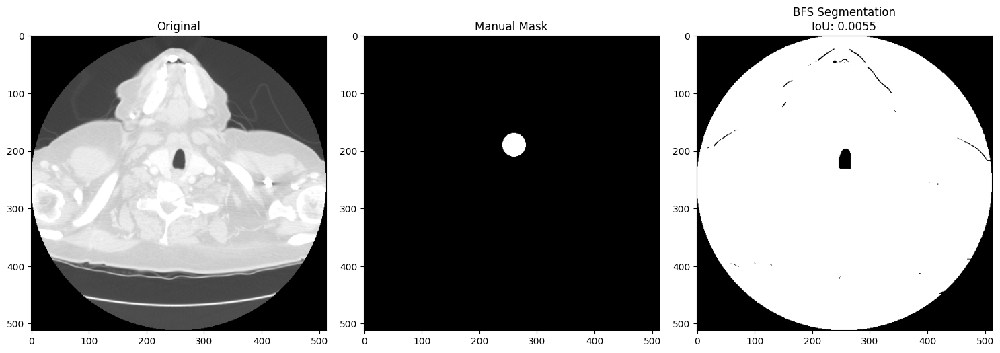

IoU for 1-001.dcm.png: 0.0055
 Processing: 1-002.dcm.png


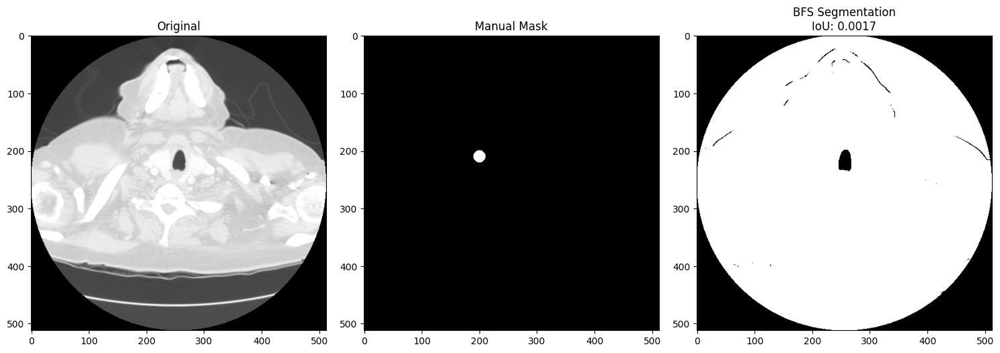

IoU for 1-002.dcm.png: 0.0017
 Processing: 1-003.dcm.png


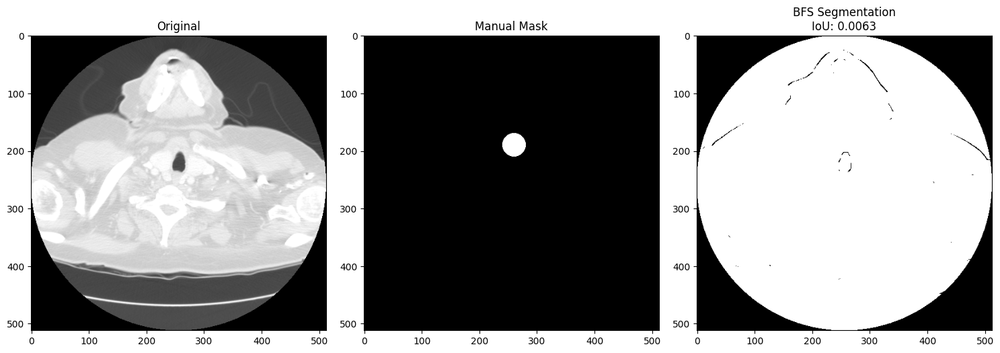

IoU for 1-003.dcm.png: 0.0063
 Processing: 1-004.dcm.png


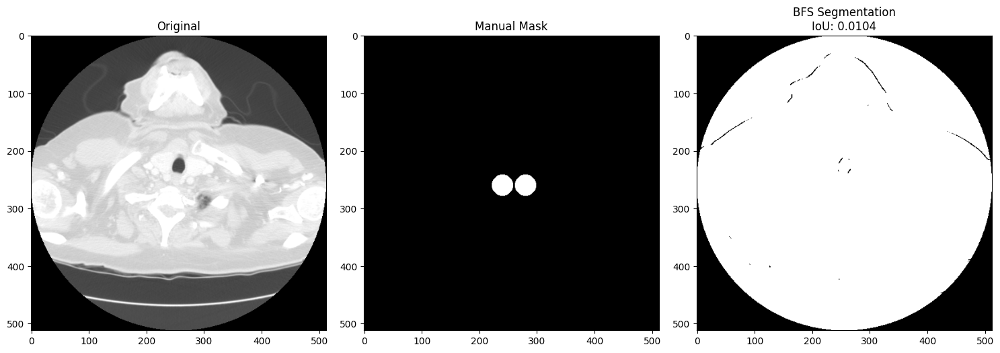

IoU for 1-004.dcm.png: 0.0104
 Processing: 1-005.dcm.png


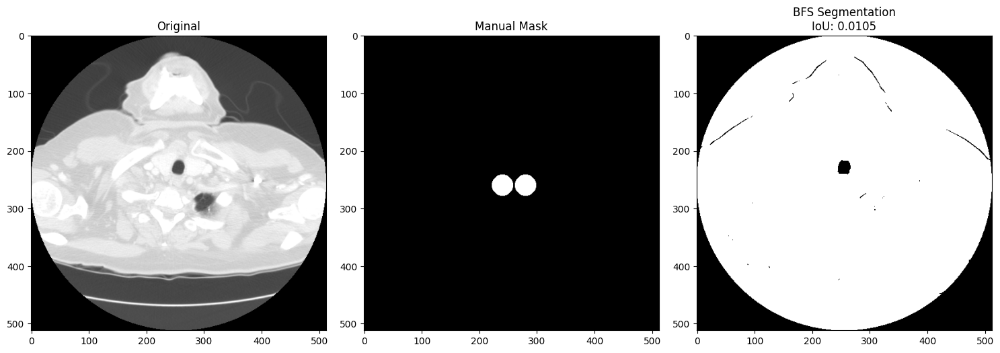

IoU for 1-005.dcm.png: 0.0105
 Processing: 1-006.dcm.png


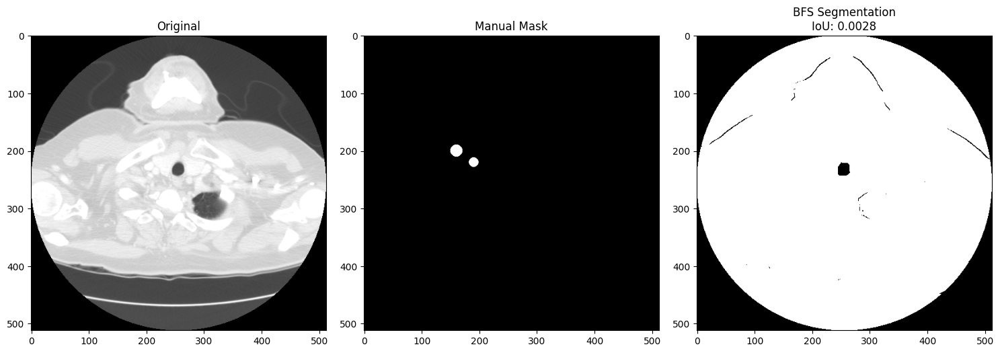

IoU for 1-006.dcm.png: 0.0028
 Processing: 1-010.dcm.png


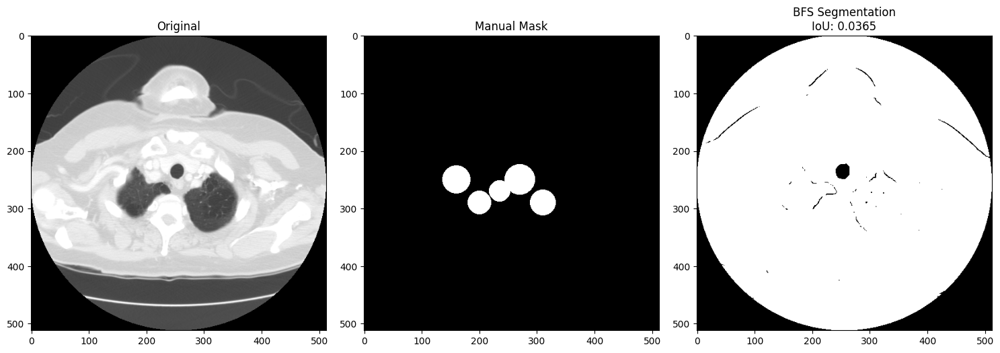

IoU for 1-010.dcm.png: 0.0365
 Processing: 1-011.dcm.png


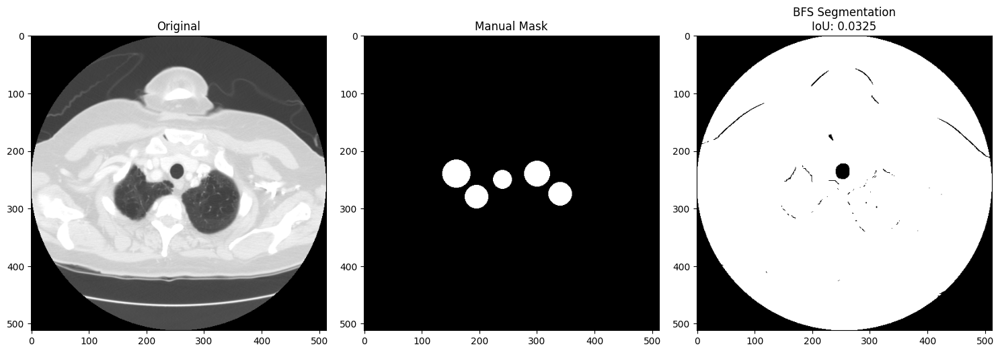

IoU for 1-011.dcm.png: 0.0325
 Processing: 1-012.dcm.png


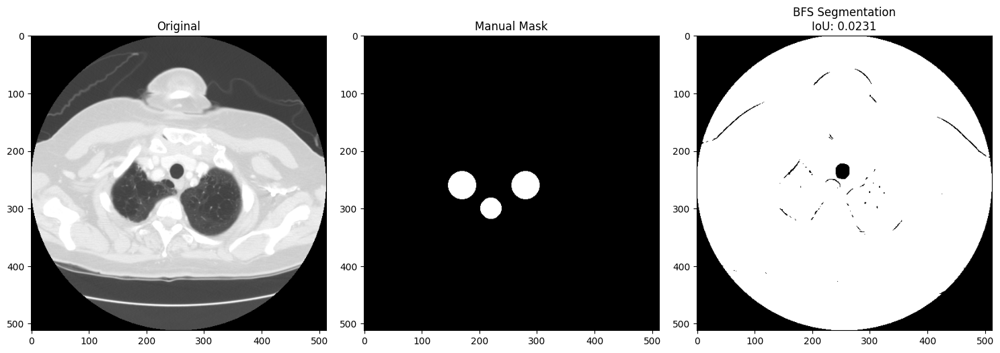

IoU for 1-012.dcm.png: 0.0231
 Processing: 1-016.dcm.png


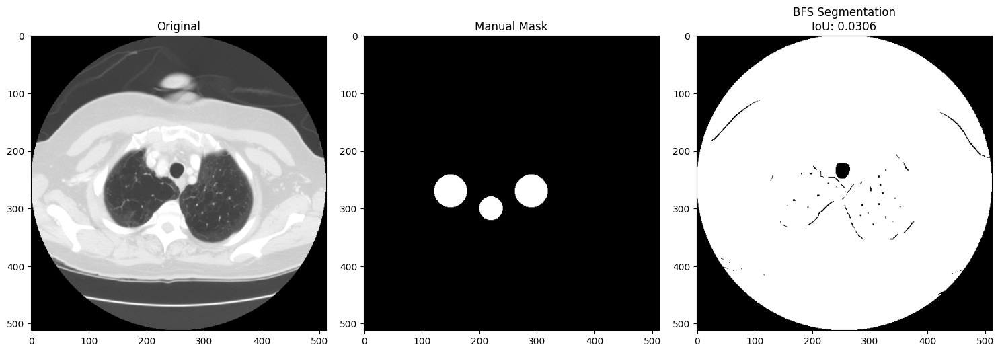

IoU for 1-016.dcm.png: 0.0306
 Processing: 1-017.dcm.png


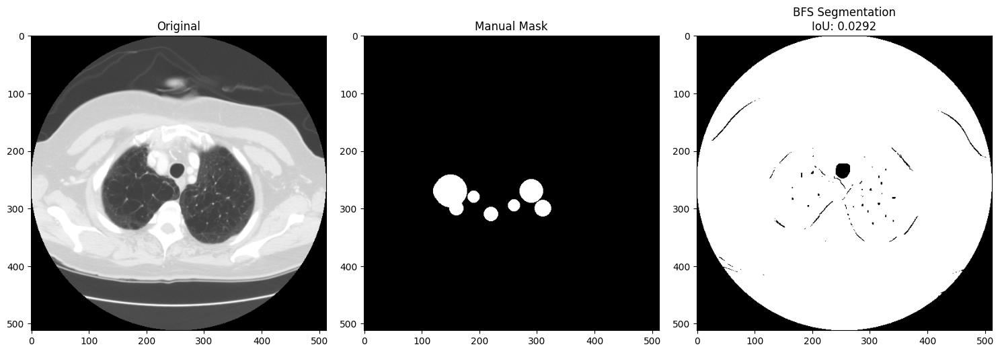

IoU for 1-017.dcm.png: 0.0292
 Processing: 1-018.dcm.png


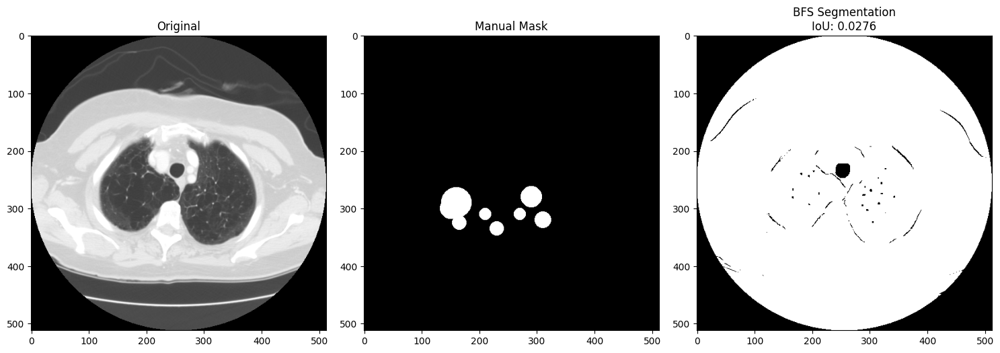

IoU for 1-018.dcm.png: 0.0276
 Processing: 1-019.dcm.png


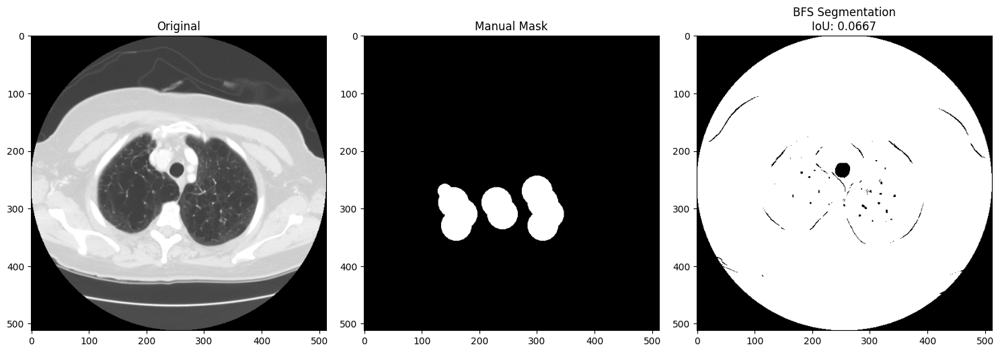

IoU for 1-019.dcm.png: 0.0667
 Processing: 1-020.dcm.png


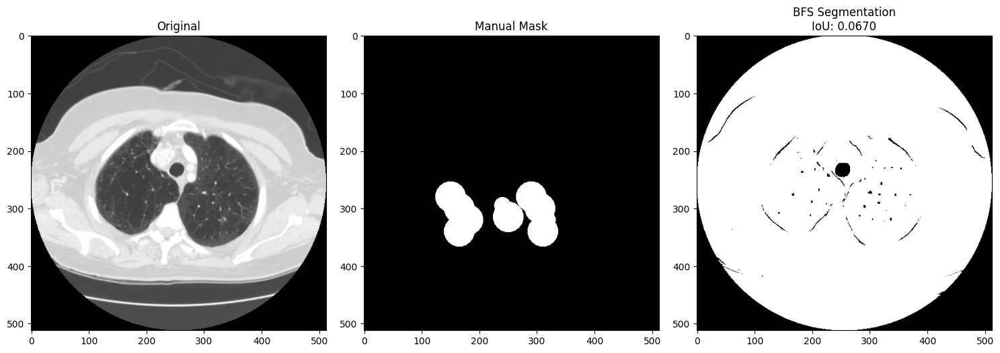

IoU for 1-020.dcm.png: 0.0670
 Processing: 1-021.dcm.png


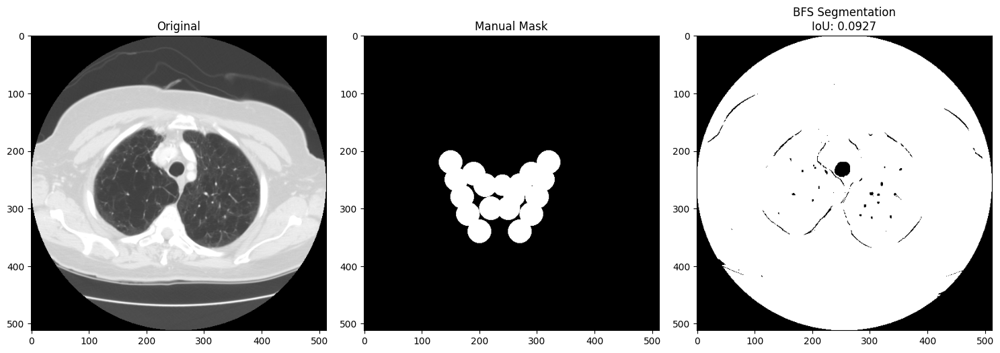

IoU for 1-021.dcm.png: 0.0927


In [ ]:
import os
import numpy as np
import cv2
from collections import deque
import matplotlib.pyplot as plt
from PIL import Image
# Cristian
#  Dynamic Threshold Calculation
def calculate_dynamic_threshold(image, factor=0.2):
    return factor * np.std(image)

#  BFS Segmentation with Multiple Seeds
def bfs_segmentation_multiple_seeds(image, seed_points, threshold):
    rows, cols = image.shape
    segmented = np.zeros_like(image)
    visited = set()
    queue = deque()

    for row, col in seed_points:
        if 0 <= row < rows and 0 <= col < cols:
            queue.append((row, col))
            segmented[row, col] = 1
            visited.add((row, col))

    directions = [(-1, 0), (1, 0), (0, -1), (0, 1)]
    while queue:
        row, col = queue.popleft()
        for dr, dc in directions:
            nr, nc = row + dr, col + dc
            if 0 <= nr < rows and 0 <= nc < cols and (nr, nc) not in visited:
                if abs(image[row, col] - image[nr, nc]) < threshold:
                    segmented[nr, nc] = 1
                    queue.append((nr, nc))
                    visited.add((nr, nc))
    return segmented


tumor_annotations = {
    "1-001.dcm.png": [(260, 190, 20)],
    "1-002.dcm.png": [(200, 210, 10)],
    "1-003.dcm.png": [(260, 190, 20)],
    "1-004.dcm.png": [(240, 260, 18), (280, 260, 18)],
    "1-005.dcm.png": [(240, 260, 18), (280, 260, 18)],
    "1-006.dcm.png": [(160, 200, 10), (190, 220, 8)],
    "1-010.dcm.png": [(160, 250, 24), (200, 290, 20), (270, 250, 26), (310, 290, 22), (235, 270, 18)],
    "1-011.dcm.png": [(160, 240, 24), (195, 280, 20), (240, 250, 16), (300, 240, 22), (340, 275, 20)],
    "1-012.dcm.png": [(170, 260, 24), (220, 300, 18), (280, 260, 24)],
    "1-016.dcm.png": [(150, 270, 28), (220, 300, 20), (290, 270, 28)],
    "1-017.dcm.png": [(150, 270, 28), (140, 270, 20), (160, 300, 12), (190, 280, 10), (220, 310, 12),
                      (260, 295, 10), (290, 270, 20), (310, 300, 14)],
    "1-018.dcm.png": [(160, 290, 26), (150, 300, 18), (165, 325, 12), (210, 310, 10), (230, 335, 12),
                      (270, 310, 10), (290, 280, 18), (310, 320, 14)],
    "1-019.dcm.png": [(140, 270, 12), (155, 290, 26), (170, 310, 26), (160, 330, 26), (230, 290, 26),
                      (240, 310, 26), (300, 270, 26), (310, 290, 26), (320, 310, 26), (310, 330, 26)],
    "1-020.dcm.png": [(150, 280, 26), (165, 300, 26), (180, 320, 26), (165, 340, 26), (240, 295, 14),
                      (250, 315, 26), (290, 280, 26), (305, 300, 26), (320, 320, 12), (310, 340, 26)],
    "1-021.dcm.png": [(150, 220, 20), (160, 250, 20), (170, 280, 20), (180, 310, 20), (200, 340, 20),
                      (220, 300, 20), (210, 260, 20), (190, 240, 20), (320, 220, 20), (310, 250, 20),
                      (300, 280, 20), (290, 310, 20), (270, 340, 20), (250, 300, 20), (270, 260, 20),
                      (290, 240, 20), (240, 260, 18), (260, 280, 18)]
}

def process_images_and_masks_multiple_seeds(dataset_folder, mask_folder):
    train_path = os.path.join(dataset_folder, 'train', 'malignant')
    mask_path = os.path.join(mask_folder, 'malignant')

    for filename, coords in tumor_annotations.items():
        img_file = os.path.join(train_path, filename)
        mask_file = os.path.join(mask_path, filename.replace('.dcm.png', '_mask.png'))

        if not os.path.exists(img_file) or not os.path.exists(mask_file):
            print(f" Missing file: {filename}")
            continue

        print(f" Processing: {filename}")
        img = np.array(Image.open(img_file).convert('L')) / 255.0
        mask = np.array(Image.open(mask_file).convert('L'))
        mask = cv2.resize(mask, (img.shape[1], img.shape[0])) / 255.0

        seeds = [(int(y), int(x)) for x, y, _ in coords]
        threshold = calculate_dynamic_threshold(img)
        segmented = bfs_segmentation_multiple_seeds(img, seeds, threshold)

        intersection = np.sum(segmented * mask)
        union = np.sum(segmented) + np.sum(mask) - intersection
        iou = intersection / union if union else 0

        plt.figure(figsize=(15, 5))
        plt.subplot(1, 3, 1)
        plt.imshow(img, cmap='gray')
        plt.title("Original")

        plt.subplot(1, 3, 2)
        plt.imshow(mask, cmap='gray')
        plt.title("Manual Mask")

        plt.subplot(1, 3, 3)
        plt.imshow(segmented, cmap='gray')
        plt.title(f"BFS Segmentation\nIoU: {iou:.4f}")

        plt.tight_layout()
        plt.show()

        print(f"IoU for {filename}: {iou:.4f}")

dataset_folder = '/content/drive/MyDrive/Kean University🎒/[0] Classes/Spring 2025 (1 13 2025 - 5 7 2025) 8 Semester /CPS 4801 Sec 02/LIDC_IDRI_PNG_CONV'
mask_folder = os.path.join(dataset_folder, 'masks')


process_images_and_masks_multiple_seeds(dataset_folder, mask_folder)




 Processing 15 manually annotated malignant images...

✅ Segmenting: 1-001.dcm.png
✅ Segmenting: 1-002.dcm.png
✅ Segmenting: 1-003.dcm.png
✅ Segmenting: 1-004.dcm.png
✅ Segmenting: 1-005.dcm.png
✅ Segmenting: 1-006.dcm.png
✅ Segmenting: 1-010.dcm.png
✅ Segmenting: 1-011.dcm.png
✅ Segmenting: 1-012.dcm.png
✅ Segmenting: 1-016.dcm.png
✅ Segmenting: 1-017.dcm.png
✅ Segmenting: 1-018.dcm.png
✅ Segmenting: 1-019.dcm.png
✅ Segmenting: 1-020.dcm.png
✅ Segmenting: 1-021.dcm.png


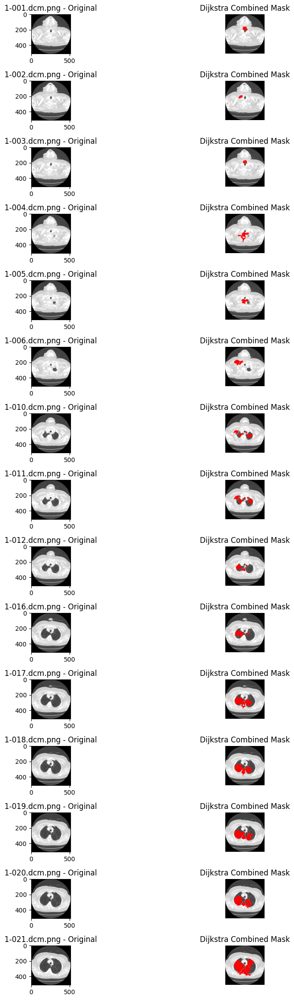

In [ ]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image
import heapq
# done by christian
tumor_annotations = {
    "1-001.dcm.png": [(260, 190, 20)],
    "1-002.dcm.png": [(200, 210, 10)],
    "1-003.dcm.png": [(260, 190, 20)],
    "1-004.dcm.png": [(240, 260, 18), (280, 260, 18)],
    "1-005.dcm.png": [(240, 260, 18), (280, 260, 18)],
    "1-006.dcm.png": [(160, 200, 10), (190, 220, 8)],
    "1-010.dcm.png": [(160, 250, 24), (200, 290, 20), (270, 250, 26), (310, 290, 22), (235, 270, 18)],
    "1-011.dcm.png": [(160, 240, 24), (195, 280, 20), (240, 250, 16), (300, 240, 22), (340, 275, 20)],
    "1-012.dcm.png": [(170, 260, 24), (220, 300, 18), (280, 260, 24)],
    "1-016.dcm.png": [(150, 270, 28), (220, 300, 20), (290, 270, 28)],
    "1-017.dcm.png": [(150, 270, 28), (140, 270, 20), (160, 300, 12), (190, 280, 10), (220, 310, 12),
                      (260, 295, 10), (290, 270, 20), (310, 300, 14)],
    "1-018.dcm.png": [(160, 290, 26), (150, 300, 18), (165, 325, 12), (210, 310, 10), (230, 335, 12),
                      (270, 310, 10), (290, 280, 18), (310, 320, 14)],
    "1-019.dcm.png": [(140, 270, 12), (155, 290, 26), (170, 310, 26), (160, 330, 26), (230, 290, 26),
                      (240, 310, 26), (300, 270, 26), (310, 290, 26), (320, 310, 26), (310, 330, 26)],
    "1-020.dcm.png": [(150, 280, 26), (165, 300, 26), (180, 320, 26), (165, 340, 26), (240, 295, 14),
                      (250, 315, 26), (290, 280, 26), (305, 300, 26), (320, 320, 12), (310, 340, 26)],
    "1-021.dcm.png": [(150, 220, 20), (160, 250, 20), (170, 280, 20), (180, 310, 20), (200, 340, 20),
                      (220, 300, 20), (210, 260, 20), (190, 240, 20), (320, 220, 20), (310, 250, 20),
                      (300, 280, 20), (290, 310, 20), (270, 340, 20), (250, 300, 20), (270, 260, 20),
                      (290, 240, 20), (240, 260, 18), (260, 280, 18)]
}

def get_adaptive_cost(image, factor=0.5):
    return factor * np.std(image)

#  Dijkstra BFS
def dijkstra_segmentation(image, start_row, start_col, max_cost):
    rows, cols = image.shape
    segmented = np.zeros_like(image)
    visited = np.full_like(image, False, dtype=bool)
    cost_map = np.full_like(image, np.inf, dtype=float)

    directions = [(-1, 0), (1, 0), (0, -1), (0, 1)]
    heap = [(0, start_row, start_col)]
    cost_map[start_row, start_col] = 0

    while heap:
        cost, row, col = heapq.heappop(heap)
        if visited[row, col]:
            continue
        visited[row, col] = True
        segmented[row, col] = 1

        for dr, dc in directions:
            r, c = row + dr, col + dc
            if 0 <= r < rows and 0 <= c < cols and not visited[r, c]:
                pixel_cost = abs(float(image[row, col]) - float(image[r, c]))
                new_cost = cost + pixel_cost
                if new_cost < cost_map[r, c] and new_cost <= max_cost:
                    cost_map[r, c] = new_cost
                    heapq.heappush(heap, (new_cost, r, c))

    return segmented

def plot_overlay(image, mask, title="Overlay"):
    image_rgb = np.stack([image]*3, axis=-1)
    overlay = image_rgb.copy()
    overlay[mask == 1] = [1, 0, 0]
    plt.imshow(overlay)
    plt.title(title)
    plt.axis('off')

#  Run Dijkstra Segmentation with Tumor Annotations
def run_dijkstra_on_selected_images(dataset_folder, tumor_annotations):
    train_folder = os.path.join(dataset_folder, 'train', 'malignant')

    print(f"\n Processing {len(tumor_annotations)} manually annotated malignant images...\n")
    plt.figure(figsize=(12, len(tumor_annotations) * 1.5))
    plot_index = 1

    for filename, coords in tumor_annotations.items():
        img_path = os.path.join(train_folder, filename)
        if not os.path.exists(img_path):
            print(f" Skipping (not found): {filename}")
            continue

        print(f"✅ Segmenting: {filename}")
        img = np.array(Image.open(img_path).convert('L')) / 255.0
        max_cost = get_adaptive_cost(img)


        combined_mask = np.zeros_like(img)

        for x, y, _ in coords:
            single_mask = dijkstra_segmentation(img, y, x, max_cost)
            combined_mask = np.logical_or(combined_mask, single_mask)


        plt.subplot(len(tumor_annotations), 2, plot_index)
        plt.imshow(img, cmap='gray')
        plt.title(f"{filename} - Original")

        plt.subplot(len(tumor_annotations), 2, plot_index + 1)
        plot_overlay(img, combined_mask.astype(np.uint8), title="Dijkstra Combined Mask")
        plot_index += 2

    plt.tight_layout()
    plt.show()


dataset_folder = '/content/drive/MyDrive/Kean University🎒/[0] Classes/Spring 2025 (1 13 2025 - 5 7 2025) 8 Semester /CPS 4801 Sec 02/LIDC_IDRI_PNG_CONV'
run_dijkstra_on_selected_images(dataset_folder, tumor_annotations)



In [ ]:
#Training and Testing of decision tree classifiers on segmented region
import torch
import matplotlib.pyplot as plt
from tqdm import tqdm
import segmentation_models_pytorch as smp
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import os
# christian

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#Instantiate UNet using smp
model = smp.Unet(encoder_name="resnet34", encoder_weights="imagenet", in_channels=3, classes=2).to(device)
# Changed criterion to handle segmentation masks
criterion = torch.nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

num_epochs = 10
train_losses = []
test_losses = []

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Changed to ImageNet stats for RGB
])


#dataset_path = '/content/drive/MyDrive/CPS 4801/LIDC_IDRI_PNG_CONV'
dataset_path = '/content/drive/MyDrive/Kean University🎒/[0] Classes/Spring 2025 (1 13 2025 - 5 7 2025) 8 Semester /CPS 4801 Sec 02/LIDC_IDRI_PNG_CONV'
train_path = os.path.join(dataset_path, 'train')
valid_path = os.path.join(dataset_path, 'valid')
test_path  = os.path.join(dataset_path, 'test')

train_data = datasets.ImageFolder(root=train_path, transform=transform)
valid_data = datasets.ImageFolder(root=valid_path, transform=transform)
test_data  = datasets.ImageFolder(root=test_path, transform=transform)

train_loader = DataLoader(train_data, batch_size=32, shuffle=True)
valid_loader = DataLoader(valid_data, batch_size=32, shuffle=False)
test_loader  = DataLoader(test_data, batch_size=32, shuffle=False)


for epoch in range(num_epochs):
    model.train()
    running_train_loss = 0.0

    for images, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}"):
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        outputs = outputs[:, 1, :, :].unsqueeze(1)

        labels = labels.view(labels.size(0), 1, 1, 1).repeat(1, 1, outputs.size(2), outputs.size(3))
        loss = criterion(outputs, labels.float())
        loss.backward()
        optimizer.step()
        running_train_loss += loss.item()

    epoch_train_loss = running_train_loss / len(train_loader)
    train_losses.append(epoch_train_loss)

    model.eval()
    running_test_loss = 0.0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            outputs = outputs[:, 1, :, :].unsqueeze(1)

            labels = labels.view(labels.size(0), 1, 1, 1).repeat(1, 1, outputs.size(2), outputs.size(3))
            loss = criterion(outputs, labels.float())
            running_test_loss += loss.item()

    epoch_test_loss = running_test_loss / len(test_loader)
    test_losses.append(epoch_test_loss)

    print(f"Epoch {epoch+1}, Train Loss: {epoch_train_loss:.4f}, Test Loss: {epoch_test_loss:.4f}")

print("Training complete.")

sample_images, sample_labels = next(iter(test_loader))
sample_images, sample_labels = sample_images.to(device), sample_labels.to(device)

model.eval()
with torch.no_grad():
    outputs = model(sample_images)
    pred_masks = outputs[:, 1, :, :].unsqueeze(1)


plt.plot(range(1, num_epochs+1), train_losses, label='Train Loss')
plt.plot(range(1, num_epochs+1), test_losses, label='Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training & Test Loss')
plt.legend()
plt.show()

Epoch 1/10:   0%|          | 0/42 [00:00<?, ?it/s]

In [ ]:
import torch.nn.functional as F
# james and christian
dice_losses = []
pixel_accuracies = []

model.eval()
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)

        outputs = model(images)
        preds = torch.sigmoid(outputs[:, 1, :, :]).unsqueeze(1)
        labels = labels.view(labels.size(0), 1, 1, 1).repeat(1, 1, preds.size(2), preds.size(3))

        # Dice Loss calculation
        smooth = 1e-5
        intersection = (preds * labels).sum(dim=(1, 2, 3))
        union = preds.sum(dim=(1, 2, 3)) + labels.sum(dim=(1, 2, 3))
        dice = (2. * intersection + smooth) / (union + smooth)
        dice_loss = 1 - dice
        dice_losses.extend(dice_loss.cpu().numpy())

        predicted = (preds > 0.5).float()
        correct_pixels = (predicted == labels).sum().item()
        total_pixels = labels.numel()
        pixel_accuracies.append(correct_pixels / total_pixels)

avg_dice = np.mean(dice_losses)
avg_acc = np.mean(pixel_accuracies) * 100

print("=" * 50)
print(f"Loss (Dice): {avg_dice:.6f}")
print(f"Accuracy: {avg_acc:.2f} %")
print("=" * 50)



Loss (Dice): 0.515293
Accuracy: 95.34 %
